# EDA 2nd round

前面已經看過一輪了從單位上爬蟲取得的大量資料了  
這邊要關注的是本專案的議題重點  
也會有多一點資料加入進來做為參考  
因為不像前面這麼大量，這邊只做一些簡易的dive in  
但會大概講解做了什麼樣的資料清洗  

# Lib

In [1]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import os
import time
import sys

# 將 hwttp 資料夾加入 Python 搜尋路徑
sys.path.append(os.path.abspath('..'))
import hwttp.hwtoolkit as tk

from statsforecast import StatsForecast
import matplotlib.pyplot as plt
import seaborn as sns

C:\Users\cerbe\anaconda3\envs\hw_ts_project\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import importlib
importlib.reload(tk)

<module 'hwttp.hwtoolkit' from 'C:\\Users\\cerbe\\Desktop\\hwts\\hwttp\\hwttp\\hwtoolkit.py'>

我寫了一個簡易的python可以將以下重點的資料一次性的導入並完成基本的資料清洗  
會在部分的地方加入一些說明  

# Load Data

## Preprocessing

In [3]:
data_paths = {'etag_5n_loc': '../data/cleaned/etag_5n_loc.csv',
              'section_info': '../data/cleaned/section_info.csv',
              'hw5_m04a_df': '../data/cleaned/hw5_m04a.csv',
              'congestion_table': '../data/cleaned/congestion_table.csv',
              'calendar_event': '../data/cleaned/calendar_event.csv',
              'road_build_event': '../data/cleaned/202301_10_road_build_event.xlsx',
              'traffic_accident_data': '../data/cleaned/202301_10_traffic_accident_data.xlsx'
             }

rs = tk.hw_df_resource(data_paths)
rs.load_raw_etag_data()
rs.load_raw_environment_info()
rs.load_raw_event_info()
rs.generate_mile_location_info()

Complete loading raw etag data
Complete loading environment and gantry info
Complete loading raw event info
Complete generating mile location info


rs這個物件會載入上述的資料來源，初步使用時會花一點時間  

In [4]:
# 這是我們目標的原始資料，五分鐘為一個單位，可以看到在沒有篩選的狀況下非常多筆
rs.hw5_m04a_df

,TimeStamp,GantryFrom,GantryTo,VehicleType,TravelTime,Traffic
0,2023-01-01 00:00:00,03F0201S,03A0041N,31,70,11
1,2023-01-01 00:00:00,03F0201S,03A0041N,32,69,1
2,2023-01-01 00:00:00,03F0201S,03A0041N,41,0,0
3,2023-01-01 00:00:00,03F0201S,03A0041N,42,0,0
4,2023-01-01 00:00:00,03F0201S,03A0041N,5,0,0
...,...,...,...,...,...,...
7223035,2024-03-31 23:55:00,05F0438N,05FR143N,31,104,1
7223036,2024-03-31 23:55:00,05F0438N,05FR143N,32,122,1
7223037,2024-03-31 23:55:00,05F0438N,05FR143N,41,0,0
7223038,2024-03-31 23:55:00,05F0438N,05FR143N,42,0,0


因為原始的資料上是根據不同車種的旅行時間、車流量分開記錄的  
為了有效分析，採用了不同車種的加權平均旅行時間計算方式進行處理  
透過tk.traveltime_aggregation中的groupby，可以獲得一個WeightedAvgTravelTime作為代表  

In [7]:
%%time
hw5_watt = tk.traveltime_aggregation(rs.hw5_m04a_df)

CPU times: total: 9min
Wall time: 9min


In [9]:
hw5_watt.head()

,TimeStamp,GantryFrom,GantryTo,WeightedAvgTravelTime,TotalTraffic,gf_gt
0,2023-01-01,03F0150N,03F0140N,38.048780,41.0,03F0150N-03F0140N
1,2023-01-01,03F0201S,03A0041N,69.916667,12.0,03F0201S-03A0041N
2,2023-01-01,03F0201S,03F0217S,61.657143,35.0,03F0201S-03F0217S
3,2023-01-01,05F0001N,03F0150N,49.400000,30.0,05F0001N-03F0150N
4,2023-01-01,05F0001N,03F0201S,201.333333,12.0,05F0001N-03F0201S


結構上沒有太大變化，只是為了每個門架之間的旅行時間做了加權平均的計算  
抹除了車種，保留旅行時間跟車流量兩種資訊  
你可能會發現每次計算這個實在是太花時間了，因此建議可以在計算完畢後進行處理  

接下來我們要進入時間序列建模前的環節  
為了讓模型訓練與驗證在前置作業能加速，不用再從頭進行資料特徵工程  
這邊將資料輸出以備後續使用

In [14]:
hw5_watt.shape, hw5_15watt.shape

((1444608, 6), (481536, 6))

In [10]:
# 過去撈取每五分鐘的資料後，再透過聚合去算平均的watt，但很花時間，這邊另存
hw5_watt.to_csv('../data/features/hw5_watt.csv', index=False)

# 考慮到資源限制，另外做一個15分鐘為單位的版本
hw5_15watt = hw5_watt.copy()
hw5_15watt['TimeStamp'] = hw5_15watt['TimeStamp'].dt.floor('15min') # old style using '15T'
hw5_15watt = hw5_15watt.groupby(['gf_gt','GantryFrom', 'GantryTo','TimeStamp'])\
                       .agg({'WeightedAvgTravelTime':'mean', 'TotalTraffic':'sum'}).reset_index()
hw5_15watt.to_csv('../data/features/hw5_15watt.csv', index=False)

## Fast load(no need to preprocess)

這邊是假設前面的前處理過程已經跑過了，方便後續EDA可以快速導入  
我們只採用15分鐘為一單位版本，另外則是透過已經撰寫好的工具包引入其他資料源  
(旅行時間就不需要在這邊使用了，因為導入後還要再做前面那塊aggregation，太慢)  

In [3]:
hw5_15watt = pd.read_csv("../data/features/hw5_15watt.csv")
# 手動排除不再範圍內的門架資訊
hw5_15watt = hw5_15watt[~hw5_15watt.gf_gt.isin(['03F0150N-03F0140N', 
                                                '03F0201S-03A0041N', 
                                                '03F0201S-03F0217S'])].copy()
hw5_15watt = hw5_15watt[hw5_15watt.TimeStamp<'2024-01-01 00:00:00'].copy()
hw5_15watt['TimeStamp'] = pd.to_datetime(hw5_15watt['TimeStamp'])

In [4]:
data_paths = {'etag_5n_loc': '../data/cleaned/etag_5n_loc.csv',
              'section_info': '../data/cleaned/section_info.csv',
              'hw5_m04a_df': '../data/cleaned/hw5_m04a.csv',
              'congestion_table': '../data/cleaned/congestion_table.csv',
              'calendar_event': '../data/cleaned/calendar_event.csv',
              'road_build_event': '../data/cleaned/202301_10_road_build_event.xlsx',
              'traffic_accident_data': '../data/cleaned/202301_10_traffic_accident_data.xlsx'
             }

rs = tk.hw_df_resource(data_paths)
# rs.load_raw_etag_data()
rs.load_raw_environment_info()
rs.load_raw_event_info()
rs.generate_mile_location_info()

Complete loading environment and gantry info
Complete loading raw event info
Complete generating mile location info


# 基本交通資訊

## 旅行時間與車流量的關係

<Axes: xlabel='WeightedAvgTravelTime', ylabel='TotalTraffic'>

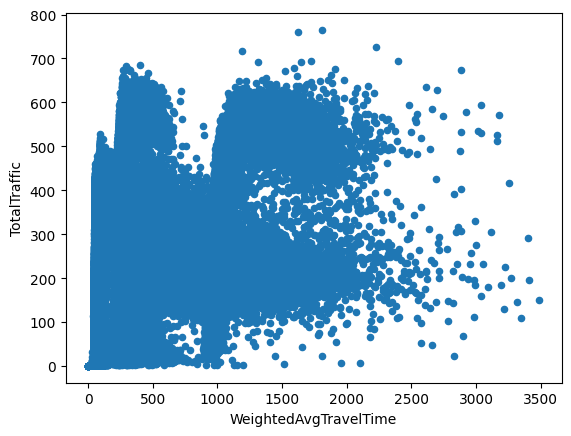

In [5]:
hw5_15watt.plot(kind='scatter', x='WeightedAvgTravelTime', y='TotalTraffic')

## 各門架間的旅行時間與車流量關係

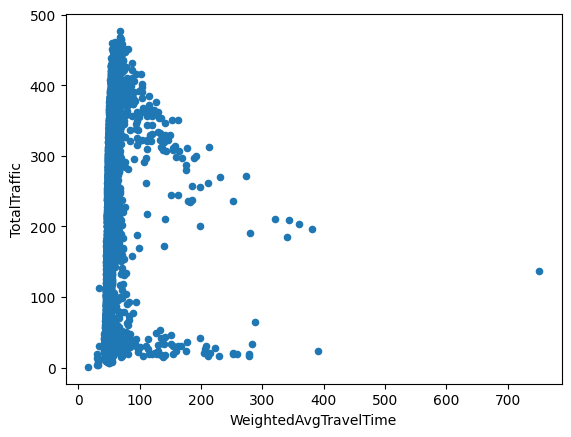

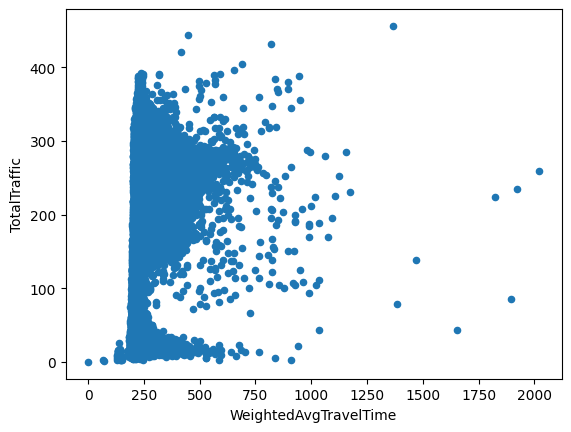

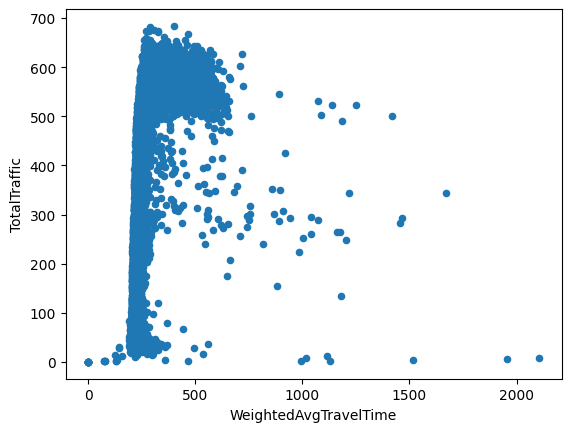

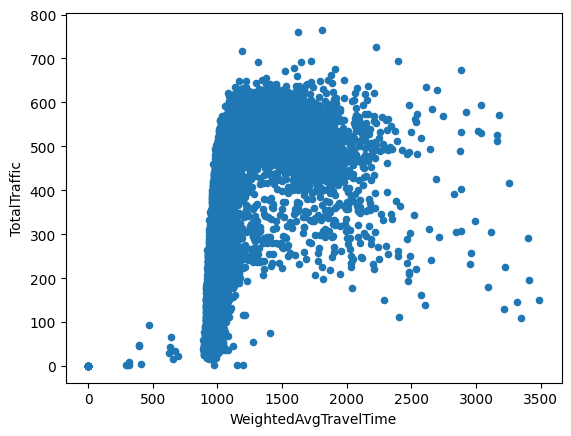

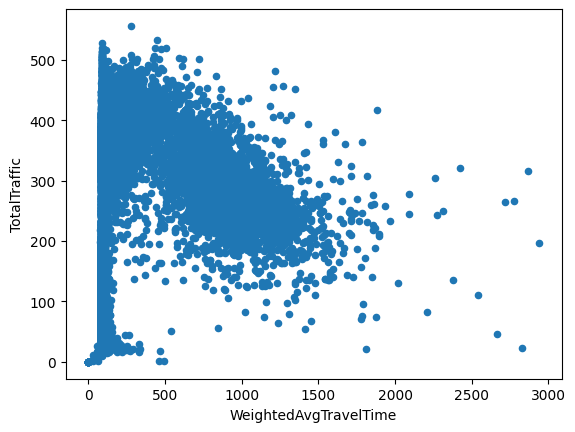

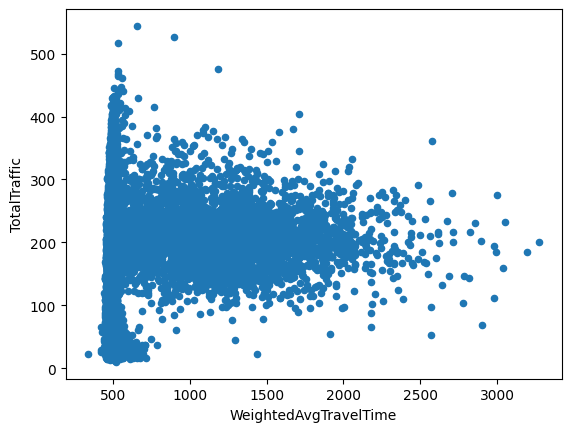

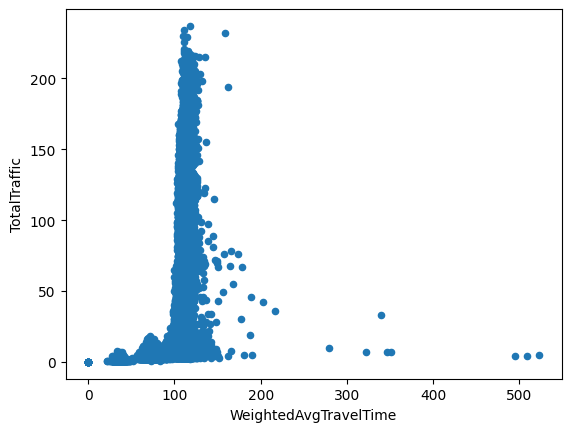

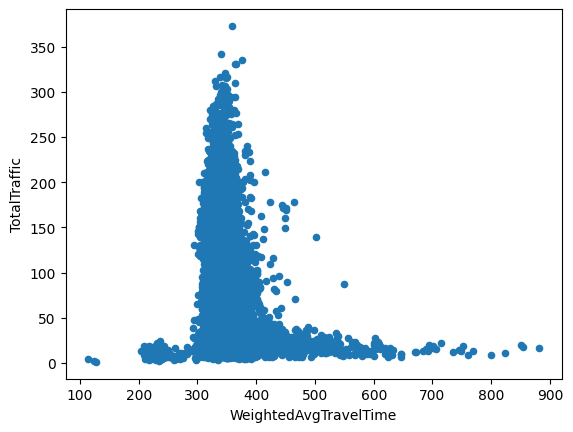

In [6]:
for gf_gt in hw5_15watt.gf_gt.unique():
    temp_df = hw5_15watt[hw5_15watt.gf_gt==gf_gt].copy()
    temp_df.plot(kind='scatter', x='WeightedAvgTravelTime', y='TotalTraffic')

In [7]:
hw5_15watt.gf_gt.unique()

array(['05F0001N-03F0150N', '05F0001N-03F0201S', '05F0055N-05F0001N',
       '05F0287N-05F0055N', '05F0309N-05F0287N', '05F0438N-05F0309N',
       '05F0438N-05FR143N', '05F0528N-05F0438N'], dtype=object)

# 外部因子對旅行時間的影響

接下來我們會分別看交通事故、節假日、道路修整對旅行時間的影響  
會分別檢視相關的資料，進入探索前，我會想將所有相關的因子全部join進旅行時間資料上  
因此在工具包中開發了function好處理我的需求  

節假日的資訊是個人整理的，原本是提供給電子商務分析應用  
這邊做過一些調整後應用在交通上  

## 特徵探索前的資料工程

In [8]:
# 移除推測與交通落差相對大的節日
drop_event_list = ['婦女節', '愚人節', '復活節', '地球日', '感恩節', 'Black Friday', 'Cyber Monday', '冬至']
rs.calendar_event = rs.calendar_event[~rs.calendar_event.event_name.isin(drop_event_list)].copy()

In [9]:
rs.calendar_event

,event_name,start_date,end_date,continuous,event_length
0,跨年元旦,2022-12-31,2023-01-02,T,3
1,農曆新年,2023-01-21,2023-01-29,T,9
2,元宵節,2023-02-05,2023-02-05,F,1
3,西洋情人節,2023-02-14,2023-02-14,F,1
4,二二八紀念日,2023-02-25,2023-02-28,T,4
6,白色情人節,2023-03-14,2023-03-14,F,1
8,兒童與清明節,2023-04-01,2023-04-05,T,5
11,勞動節,2023-04-29,2023-05-01,T,3
12,母親節,2023-05-09,2023-05-09,F,1
13,端午節,2023-06-22,2023-06-25,T,4


In [10]:
# 總共有的節日數
rs.calendar_event.shape

(25, 5)

In [11]:
%%time
# 使用tk工具來加入road build, holiday, traffic event 三種資訊到目標上
road_build_event, hw5_15watt_rb = tk.add_road_build_event(hw5_15watt, 
                                                          rs.road_build_event, 
                                                          rs.milelocation_info_df)
hw5_15watt_holi_rb = tk.add_calendar_event(hw5_15watt_rb, rs.calendar_event).copy()
# hw5_15watt_holi_rb.rename(columns={'event_name':'holiday_name',
#                                    'continuous':'holiday_continue',
#                                    'event_length':'holiday_length'},
#                           inplace=True)

traffic_accident_data, hw5_15watt_holi_rb_tra = tk.add_traffic_event(hw5_15watt_holi_rb, 
                                                                     rs.traffic_accident_data, 
                                                                     rs.milelocation_info_df)
# hw5_15watt_holi.fillna({'holiday_continue':'F', 
#                         'holiday_length':0,
#                       }, inplace=True)

100%|██████████| 4354/4354 [00:21<00:00, 200.60it/s]


Complete checking & extract road_build_event


100%|██████████| 3807/3807 [00:40<00:00, 94.61it/s] 


Complete road_build_event insertion to current df
will return 2 object: road_build_event, df


C:\Users\cerbe\Desktop\hwts\hwttp\hwttp\hwtoolkit.py:165: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  target_gantry_pair_df['continuous'] = target_gantry_pair_df['continuous'].replace({'T': 1, 'F': 0})
100%|██████████| 179/179 [00:00<00:00, 437.75it/s]


Complete checking traffic accident data, total event count = 115


  0%|          | 0/115 [00:00<?, ?it/s]C:\Users\cerbe\Desktop\hwts\hwttp\hwttp\hwtoolkit.py:427: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '544' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[df.index.isin(item['df_index']), key] = item[key]
C:\Users\cerbe\Desktop\hwts\hwttp\hwttp\hwtoolkit.py:427: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '619' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[df.index.isin(item['df_index']), key] = item[key]
C:\Users\cerbe\Desktop\hwts\hwttp\hwttp\hwtoolkit.py:427: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'A3' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
 

Complete traffic accident data insertion
will return 2 object: target_traffic_accident_data, df
CPU times: total: 3min 41s
Wall time: 3min 43s


In [12]:
hw5_15watt_holi_rb_tra['month'] = hw5_15watt_holi_rb_tra['TimeStamp'].dt.month
hw5_15watt_holi_rb_tra['hour'] = hw5_15watt_holi_rb_tra['TimeStamp'].dt.hour

In [13]:
# 這個就是我們後續分析應用的基礎資料，欄位眾多
hw5_15watt_holi_rb_tra.keys()

Index(['gf_gt', 'GantryFrom', 'GantryTo', 'TimeStamp', 'WeightedAvgTravelTime',
       'TotalTraffic', 'road_build', 'total_block_count', 'road_block_count',
       'holiday_continue', 'holiday_length', 'dayofweek', 'holiday_name',
       'holiday_name_七夕情人節', 'holiday_name_中元節', 'holiday_name_中秋節',
       'holiday_name_二二八紀念日', 'holiday_name_元宵節', 'holiday_name_兒童與清明節',
       'holiday_name_勞動節', 'holiday_name_國慶日', 'holiday_name_教師節',
       'holiday_name_母親節', 'holiday_name_父親節', 'holiday_name_白色情人節',
       'holiday_name_端午節', 'holiday_name_聖誕節', 'holiday_name_萬聖節',
       'holiday_name_西洋情人節', 'holiday_name_跨年元旦', 'holiday_name_農曆新年',
       'accident_mileage', 'event_occurrence', 'event_exclusion',
       'handling_minutes', 'accident_type', 'death_count', 'injuries_count',
       'inner_shoulder_flag', 'inner_lane_flag', 'middle_inner_lane_flag',
       'middle_lane_flag', 'middle_outer_lane_flag', 'outer_lane_flag',
       'outer_shoulder_flag', 'ramp_flag', 'overturn_accident_

## 排除事故、節日、道路修整的正常旅行時間

資料附加完畢，我們先看看正常情況下各門架路段的旅行時間統計量  
為了要能比較，我們可以利用幾個關鍵的欄位來排除外部因素影響的結果  
資料量可能會變少，但這是為了能做到確認必須妥協  

In [14]:
print(f'original data shape = {hw5_15watt_holi_rb_tra.shape}')
condi_1 = hw5_15watt_holi_rb_tra.holiday_name.isna() == True
print(f'remove only holiday data shape = {hw5_15watt_holi_rb_tra[condi_1].shape}')
condi_2 = hw5_15watt_holi_rb_tra.road_build == 0
print(f'remove only road build data shape = {hw5_15watt_holi_rb_tra[condi_2].shape}')
condi_3 = hw5_15watt_holi_rb_tra.accident_type == 0
print(f'remove only traffic accident data shape = {hw5_15watt_holi_rb_tra[condi_3].shape}')
print(f'remove above condition to gain normal data shape = {hw5_15watt_holi_rb_tra[condi_1 & condi_2 &condi_3].shape}')

normal_traffic_df = hw5_15watt_holi_rb_tra[condi_1 & condi_2 &condi_3].copy()

original data shape = (280320, 59)
remove only holiday data shape = (244992, 59)
remove only road build data shape = (217238, 59)
remove only traffic accident data shape = (280125, 59)
remove above condition to gain normal data shape = (186755, 59)


In [15]:
# 確認每個月分資料量
normal_traffic_df.month.value_counts()

month
11    23019
12    21504
7     18160
3     16859
5     15469
8     15457
6     14697
10    14213
4     12659
2     12209
9     11295
1     11214
Name: count, dtype: int64

每個月的正常旅行時間資料量不同，但不影響  

<Axes: >

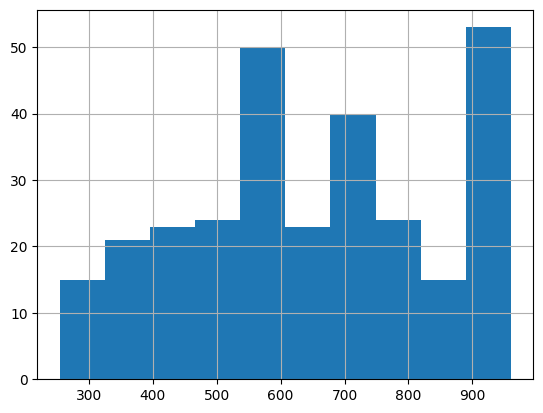

In [16]:
# 確認每個月分資料量分布
normal_traffic_df.groupby(['month', 'hour']).TimeStamp.count().reset_index().TimeStamp.hist()

## 每月平均旅行時間變化

我們借助nixtla的statsforecast 作為基礎繪圖的參考，算是一個偷吃步  
因為不同gantry pair的路線長度不同，旅行時間(秒數)當然也不會一樣  
但有少數落差較大，特別是05F0309N-05F0287N，有機會差到兩分鐘  

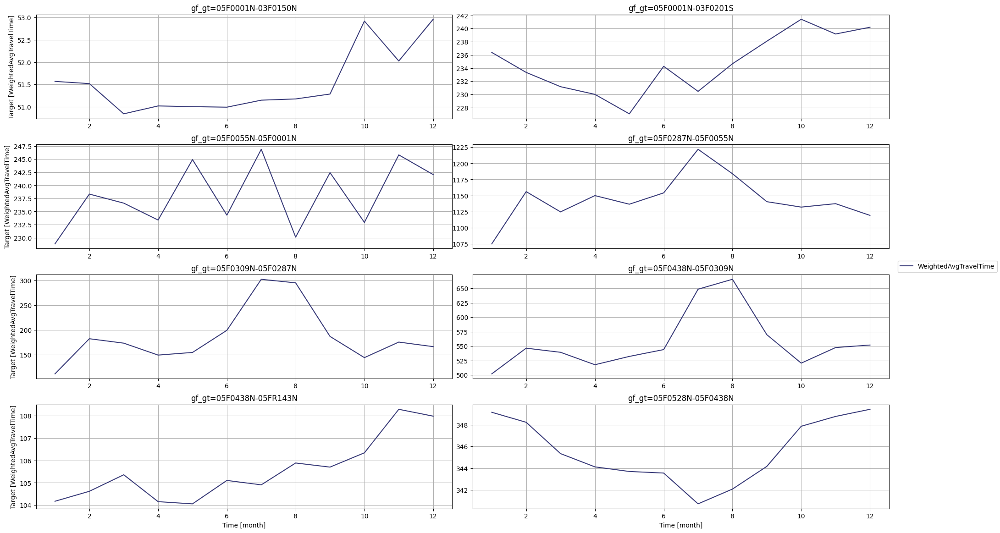

In [17]:
df = normal_traffic_df.groupby(['gf_gt', 'month']).agg({'WeightedAvgTravelTime':'mean'}).reset_index()
StatsForecast.plot(df, id_col='gf_gt', time_col='month',target_col='WeightedAvgTravelTime')

In [18]:
for gf_gt in df.gf_gt.unique():
    temp_df =  df[df.gf_gt==gf_gt].copy()
    dif = temp_df.WeightedAvgTravelTime.max() - temp_df.WeightedAvgTravelTime.min()
    print(f' pair = {gf_gt}, max - min month watt = {dif/60} mins')

 pair = 05F0001N-03F0150N, max - min month watt = 0.035329745540818296 mins
 pair = 05F0001N-03F0201S, max - min month watt = 0.23951064826752125 mins
 pair = 05F0055N-05F0001N, max - min month watt = 0.3013055203922065 mins
 pair = 05F0287N-05F0055N, max - min month watt = 2.4527829619435164 mins
 pair = 05F0309N-05F0287N, max - min month watt = 3.1796024642713387 mins
 pair = 05F0438N-05F0309N, max - min month watt = 2.7293750723377115 mins
 pair = 05F0438N-05FR143N, max - min month watt = 0.07049541482358872 mins
 pair = 05F0528N-05F0438N, max - min month watt = 0.14459638073125614 mins


## 平日、假日的平均旅行時間

因為不同gantry pair的路線長度不同，旅行時間(秒數)當然也不會一樣

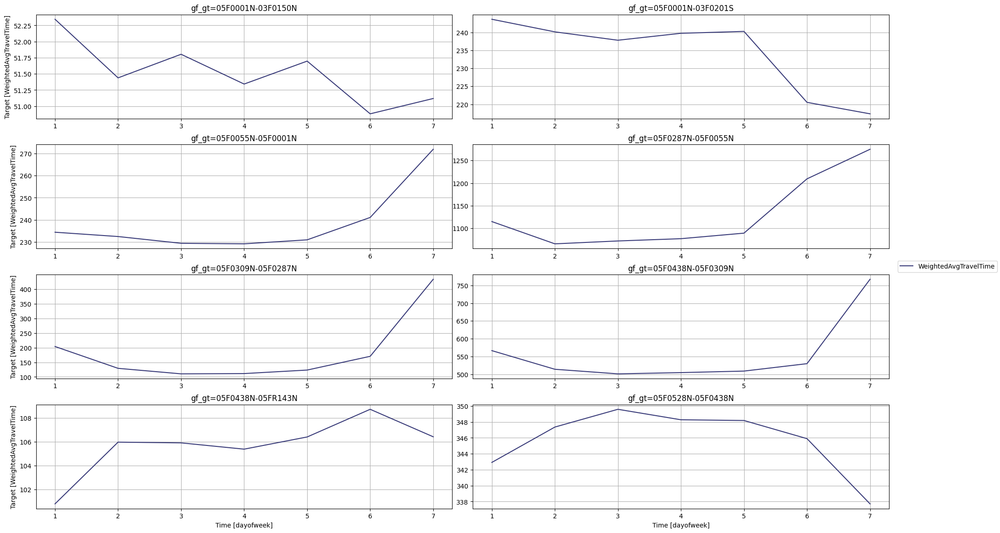

In [19]:
df = normal_traffic_df.groupby(['gf_gt', 'dayofweek']).agg({'WeightedAvgTravelTime':'mean'}).reset_index()
StatsForecast.plot(df, id_col='gf_gt', time_col='dayofweek',target_col='WeightedAvgTravelTime')


In [20]:
for gf_gt in df.gf_gt.unique():
    temp_df =  df[df.gf_gt==gf_gt].copy()
    dif = temp_df.WeightedAvgTravelTime.max() - temp_df.WeightedAvgTravelTime.min()
    print(f' pair = {gf_gt}, max - min month watt = {dif/60} mins')

 pair = 05F0001N-03F0150N, max - min month watt = 0.02437783938579597 mins
 pair = 05F0001N-03F0201S, max - min month watt = 0.4387609856258971 mins
 pair = 05F0055N-05F0001N, max - min month watt = 0.7128399951960053 mins
 pair = 05F0287N-05F0055N, max - min month watt = 3.4781898039280086 mins
 pair = 05F0309N-05F0287N, max - min month watt = 5.386124835424501 mins
 pair = 05F0438N-05F0309N, max - min month watt = 4.435903659670121 mins
 pair = 05F0438N-05FR143N, max - min month watt = 0.1326680032855324 mins
 pair = 05F0528N-05F0438N, max - min month watt = 0.19803102595724056 mins


## 平日、假日內的單日旅行時間pattern

在官方提供的資料中其實有包含認定的道路壅擠時段  
接下來我們可以搭配檢視其有效性  
所以在normal_traffic_df之上再多copy一份，接上壅擠資訊  
他會多附上一個congestion_syndrome特徵

In [21]:
normal_traffic_df_cong = tk.add_congestion_condition(normal_traffic_df, 
                                                     rs.congestion_table, 
                                                     rs.milelocation_info_df).copy()

locate same df.index before
locate same df.index before
locate same df.index before
locate same df.index before
locate same df.index before
locate same df.index before
locate same df.index before
locate same df.index before
locate same df.index before
locate same df.index before
locate same df.index before
locate same df.index before
locate same df.index before
locate same df.index before
locate same df.index before
locate same df.index before


In [22]:
normal_traffic_df_cong.congestion_syndrome.unique()

array([0, 1], dtype=int64)

由下圖可知，並非所有的壅塞時間都有被官方標註(灰色)   
初步懷疑也是因如此，在所有gantry上有的標註是好的有的是壞的  
因為不同gantry pair的路線長度不同，旅行時間(秒數)當然也不會一樣  

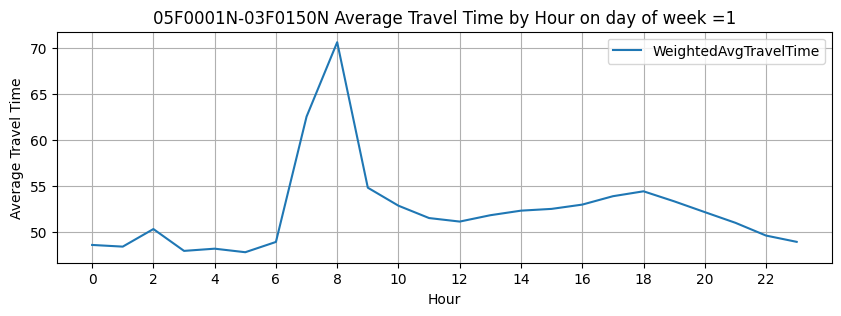

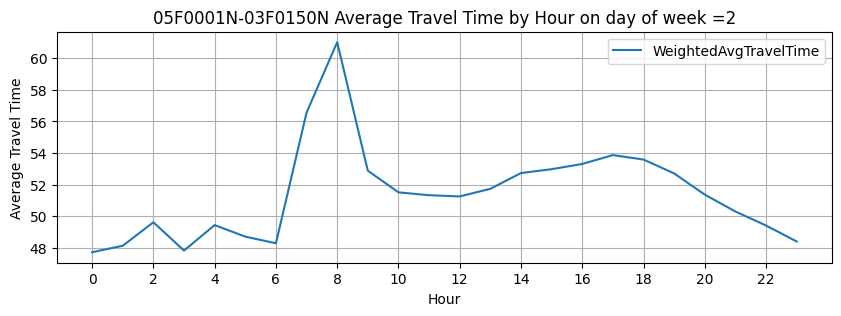

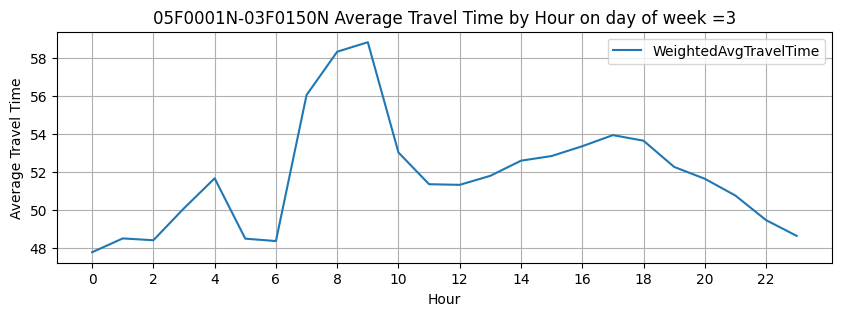

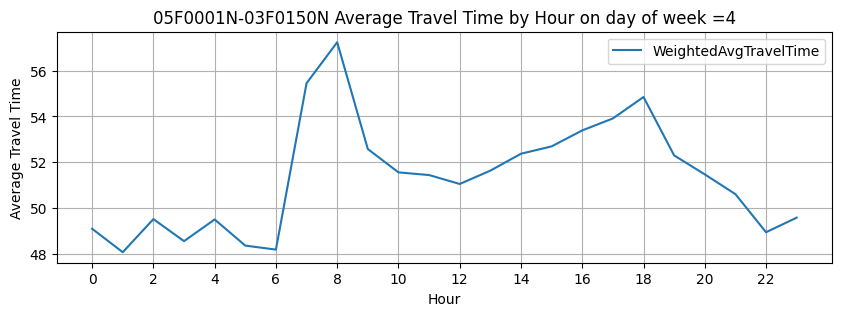

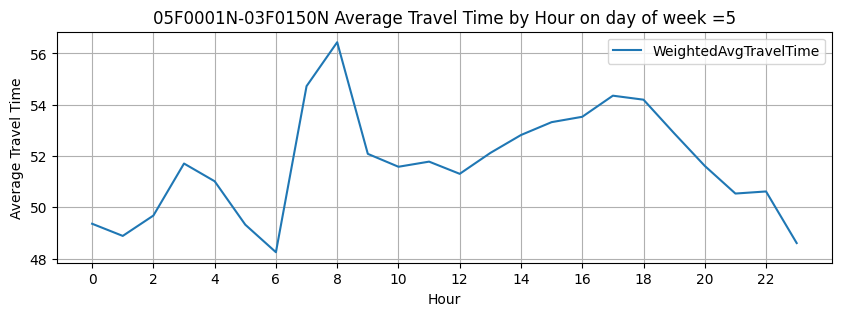

...

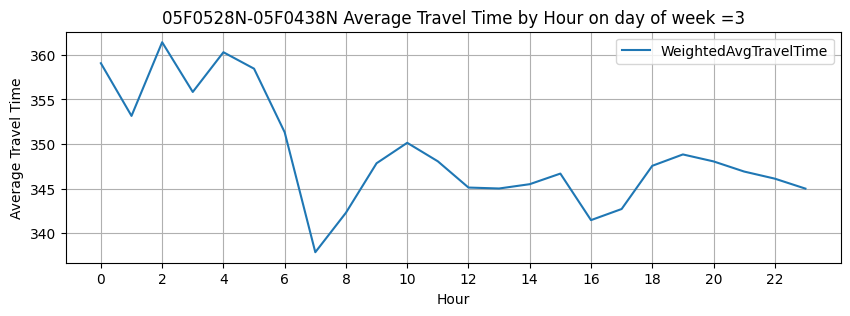

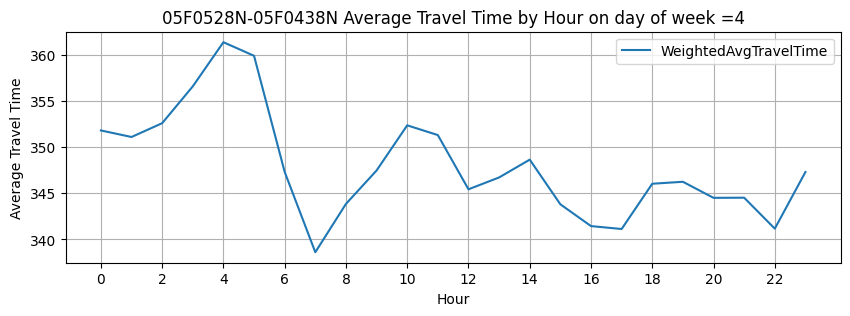

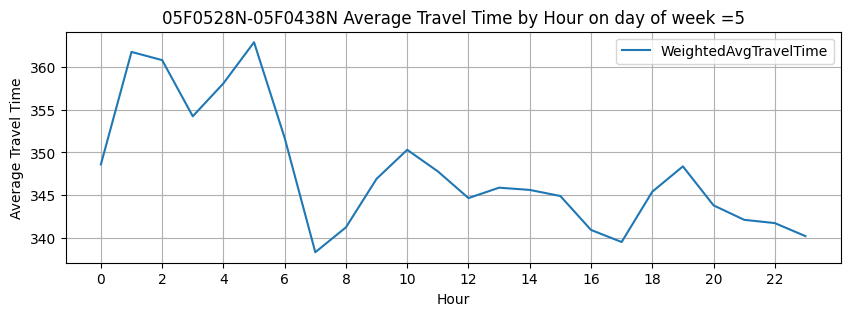

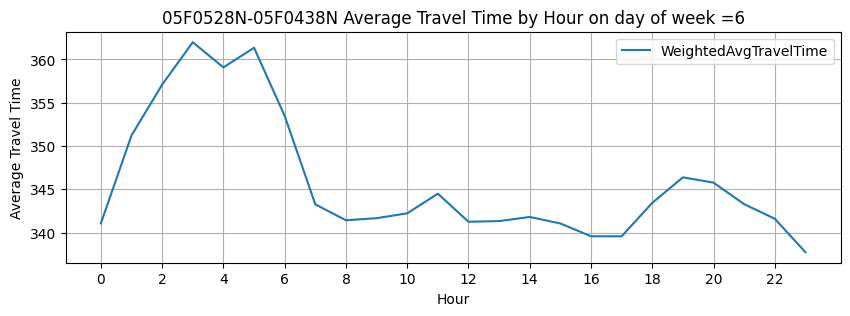

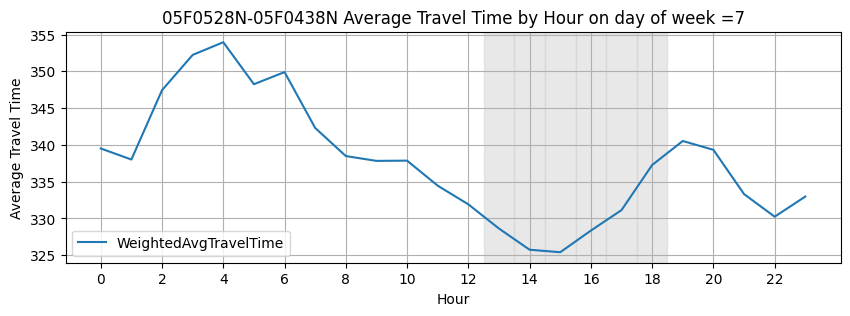

In [23]:
for gf_gt in normal_traffic_df_cong.gf_gt.unique():
    for dayofweek in range(1,8):
        df = normal_traffic_df_cong.copy()
        df = df[(df.gf_gt==gf_gt) & (df.dayofweek==dayofweek)].copy()
        df = df.groupby(['hour']).agg({'WeightedAvgTravelTime':'mean', 'congestion_syndrome':'max'}).reset_index()

        fig, ax = plt.subplots()
        df.plot(x='hour', y='WeightedAvgTravelTime', kind='line', 
                grid=True, 
                figsize=(10,3),
                ax=ax
               )
        plt.xticks(ticks=np.arange(0, 24, 2))  # 每兩小時一個標籤
        plt.xlabel('Hour')
        plt.ylabel('Average Travel Time')
        plt.title(f'{gf_gt} Average Travel Time by Hour on day of week ={dayofweek}')
    
        cong_hours = df[df['congestion_syndrome'] == 1]['hour'].unique()
    # print(cong_hours)
    # 添加壅塞區間的背景色
        for hour in cong_hours:
            plt.axvspan(hour - 0.5, hour + 0.5, color='lightgrey', alpha=0.5)            
        
        plt.show()

上述的視覺化方法是將週間的每天都拆開來看  
下面則是把繪圖的方式略做修改，我們來看看每個門架間旅行時間一週的差異  
每條線代表的是周一到周日  

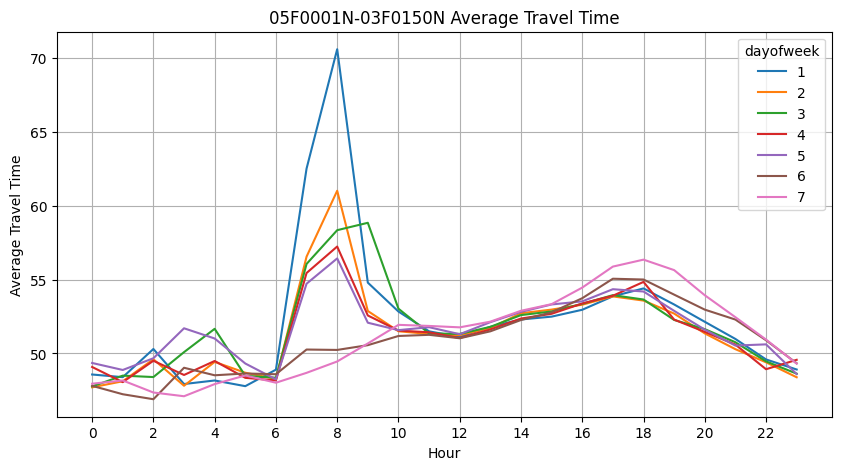

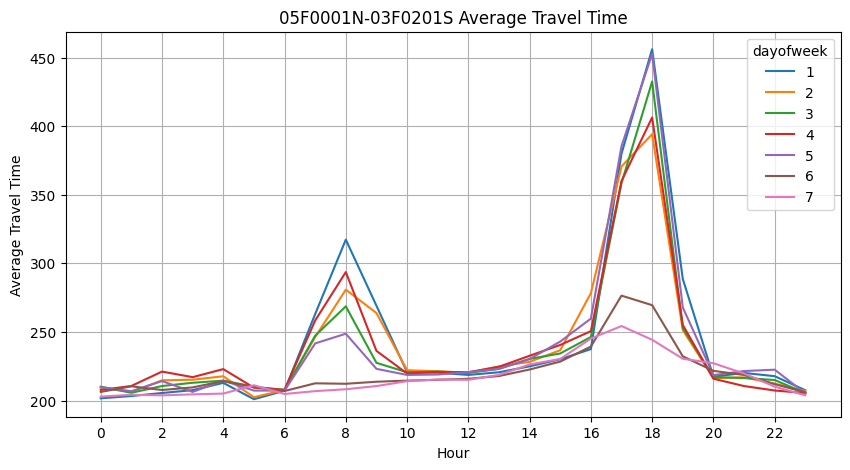

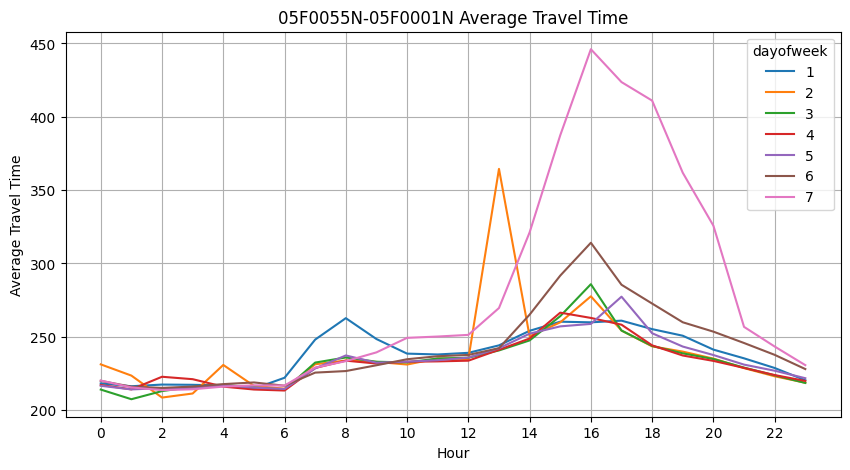

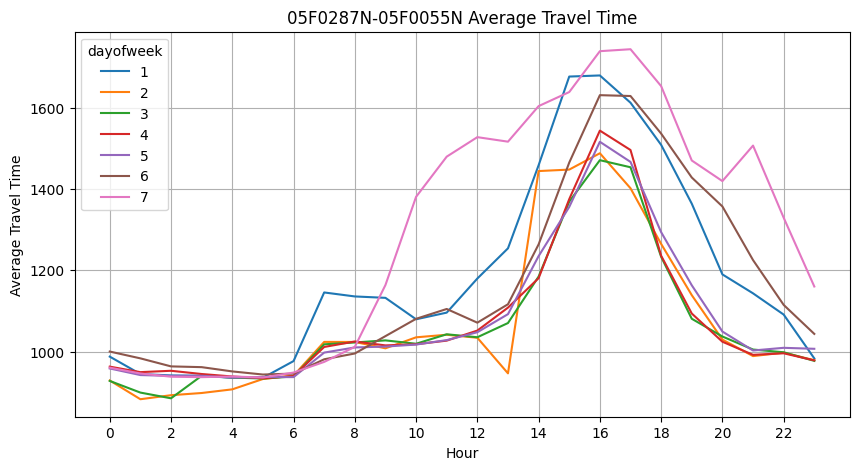

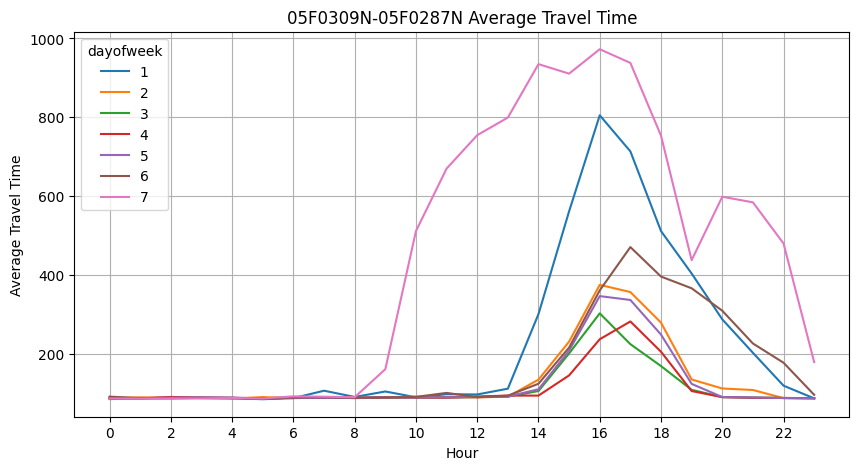

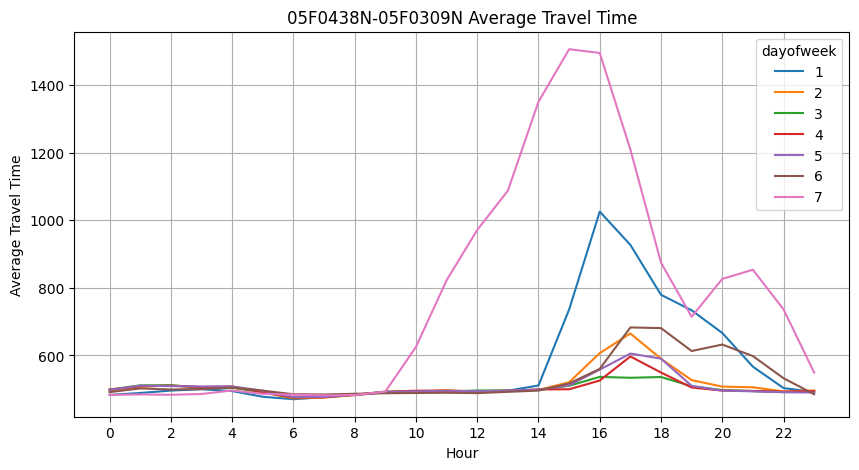

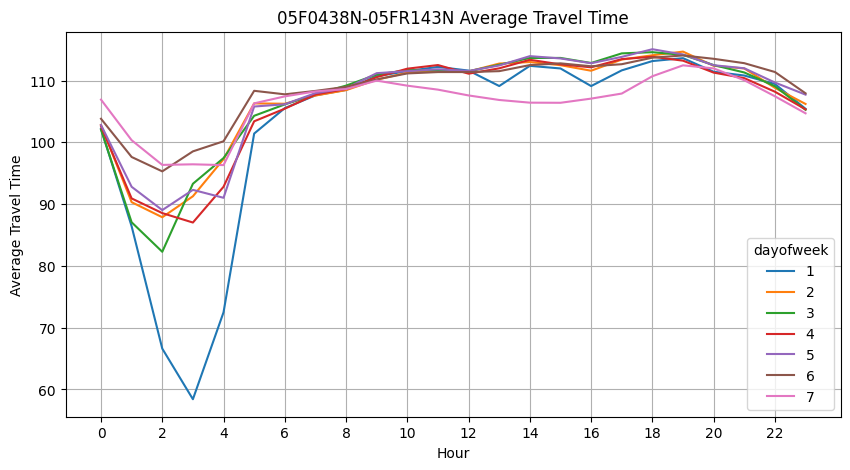

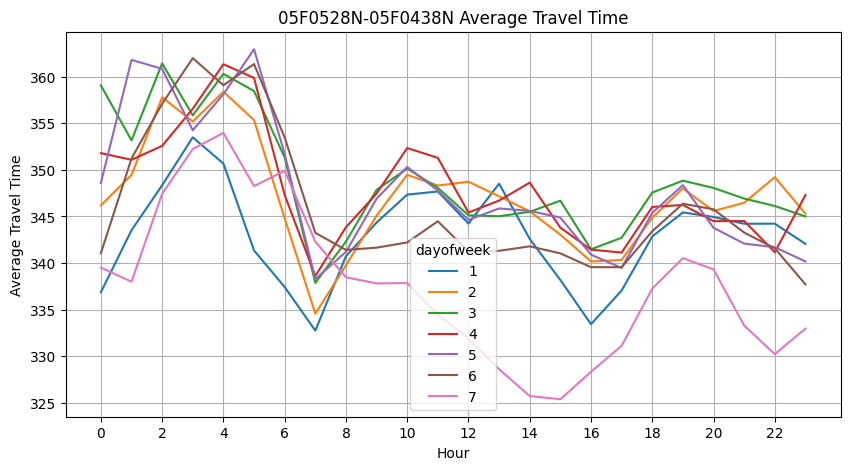

In [24]:
for gf_gt in normal_traffic_df_cong.gf_gt.unique():
    df = normal_traffic_df_cong[normal_traffic_df_cong.gf_gt==gf_gt].copy()
    df = df.groupby(['dayofweek', 'hour']).agg({'WeightedAvgTravelTime':'mean', 'congestion_syndrome':'sum'}).reset_index()

    pivot_table = df.pivot_table(index='hour', columns='dayofweek', values='WeightedAvgTravelTime', aggfunc='mean')    
    fig, ax = plt.subplots()
    pivot_table.plot(kind='line', 
                     grid=True, 
                     figsize=(10,5),
                     ax=ax,
                     title=f'{gf_gt} Average Travel Time',
                     ylabel='Average Travel Time',
                     xlabel='Hour',
                     xticks=np.arange(0, 24, 2)
                     )
    plt.show()

由上可知，明顯在不同gantry pair下，平日與假日的模式完全不一樣，會有比較顯著區別的大致會是星期一、星期六、星期日

In [25]:
for gf_gt in normal_traffic_df.gf_gt.unique():
    temp_df = normal_traffic_df[normal_traffic_df.gf_gt==gf_gt].copy()
    temp_df = temp_df.groupby(['dayofweek', 'hour']).agg({'WeightedAvgTravelTime':'mean'}).reset_index()

    for hour in temp_df.hour.unique():
        dif = temp_df[temp_df.hour==hour].WeightedAvgTravelTime.max() - temp_df[temp_df.hour==hour].WeightedAvgTravelTime.min()
        print(f' pair = {gf_gt}, {hour}, max - min month watt = {dif/60} mins')

 pair = 05F0001N-03F0150N, 0, max - min month watt = 0.027476734443568893 mins
 pair = 05F0001N-03F0150N, 1, max - min month watt = 0.027396705479068948 mins
 pair = 05F0001N-03F0150N, 2, max - min month watt = 0.05669922603643454 mins
 pair = 05F0001N-03F0150N, 3, max - min month watt = 0.0767090341042954 mins
 pair = 05F0001N-03F0150N, 4, max - min month watt = 0.06238981149035763 mins
 pair = 05F0001N-03F0150N, 5, max - min month watt = 0.02557381052216255 mins
 pair = 05F0001N-03F0150N, 6, max - min month watt = 0.014731320933659593 mins
 pair = 05F0001N-03F0150N, 7, max - min month watt = 0.23053333188724992 mins
 pair = 05F0001N-03F0150N, 8, max - min month watt = 0.35245501839232246 mins
 pair = 05F0001N-03F0150N, 9, max - min month watt = 0.13812371851591862 mins
 pair = 05F0001N-03F0150N, 10, max - min month watt = 0.030802676181269105 mins
 pair = 05F0001N-03F0150N, 11, max - min month watt = 0.010031577944263384 mins
 pair = 05F0001N-03F0150N, 12, max - min month watt = 0.01

## 重點節假日對旅行時間影響

前面看完了一般狀況下的旅行時間，接下來分別就特定外部因子做檢視  

以下是觀察每個門架間的旅行時間，用boxplot繪製星期幾的0~24小時旅行時間分布差異  
這邊包成一個簡易的function繪圖  
後面其他的探索重點類似  

In [79]:
def holiday_vs_normal_watt() -> None:
    # 拉出事故的部分
    condi_1 = hw5_15watt_holi_rb_tra.holiday_name.isna() == False
    holiday_only_df = hw5_15watt_holi_rb_tra[condi_1].copy()
    
    holiday_only_df['cat'] = 'holiday'
    normal_traffic_df['cat'] = 'normal'
    
    # 組合節假日與正常日的資料
    nu_df = pd.concat([holiday_only_df[['gf_gt', 'hour', 'dayofweek', 'WeightedAvgTravelTime', 'cat']],
                       normal_traffic_df[['gf_gt', 'hour', 'dayofweek', 'WeightedAvgTravelTime', 'cat']]])       

    for gf_gt in nu_df.gf_gt.unique():
        for dayofweek in range(1,8):
            temp_df = nu_df[(nu_df.gf_gt==gf_gt) & (nu_df.dayofweek==dayofweek)].copy()
            sns.boxplot(x="hour", y="WeightedAvgTravelTime",
                        hue="cat", palette=["r", "g"],
                        data=temp_df)
            plt.title(f'{gf_gt} WATT by Hour on day of week ={dayofweek} comparison')
            plt.show()
    return None

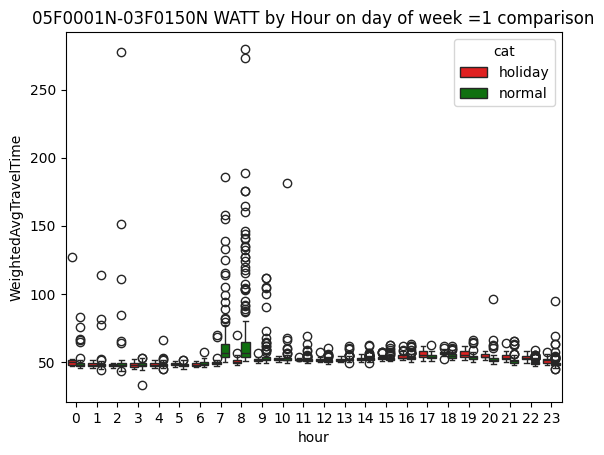

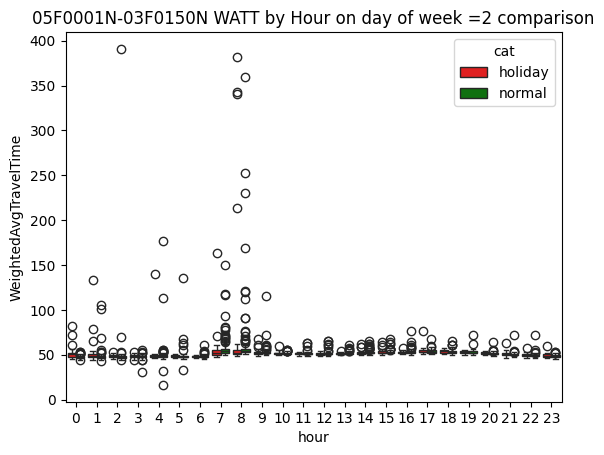

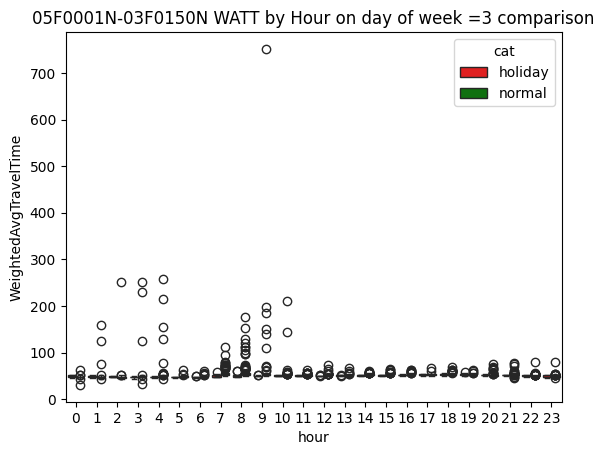

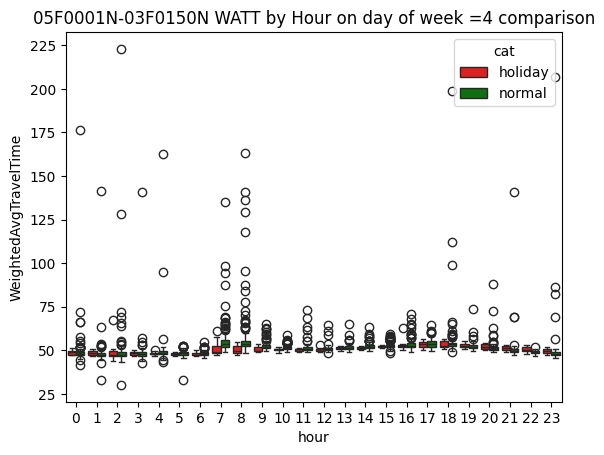

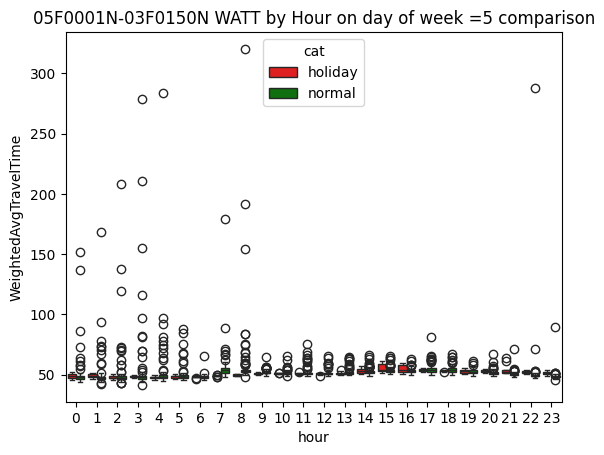

...

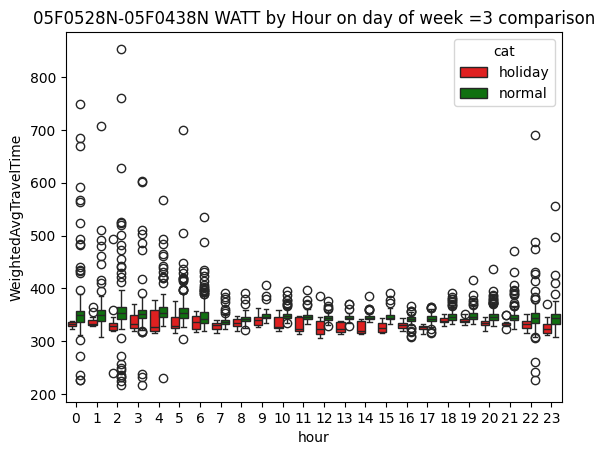

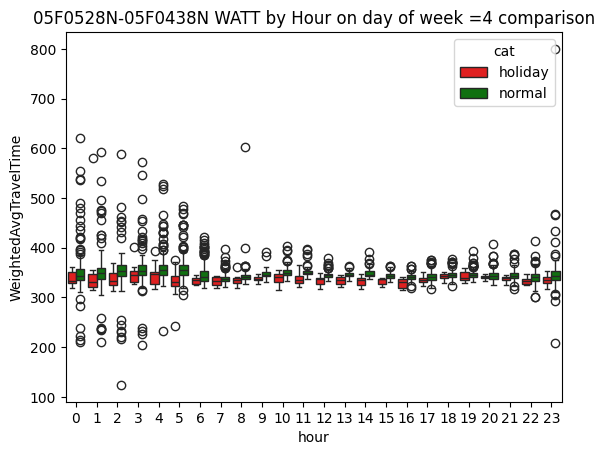

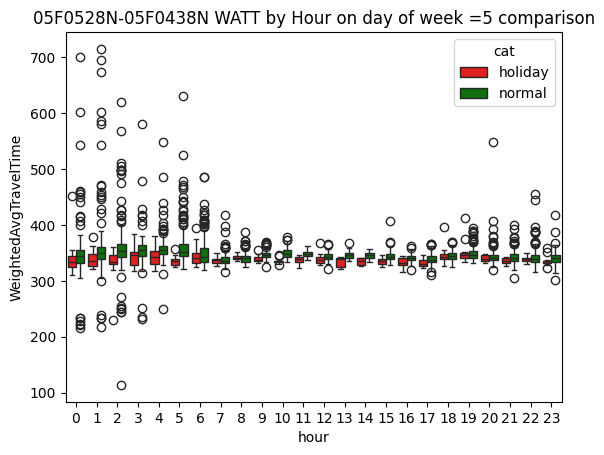

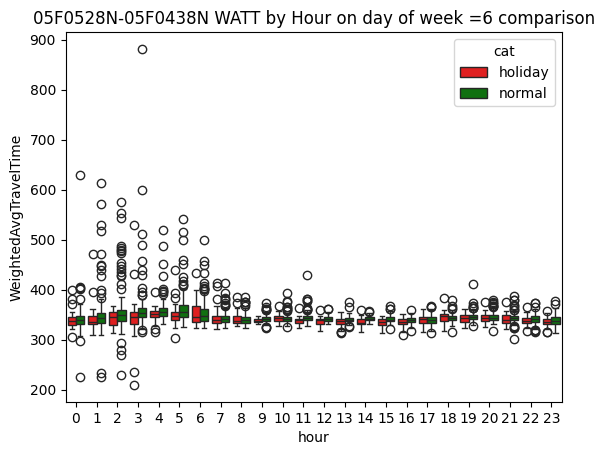

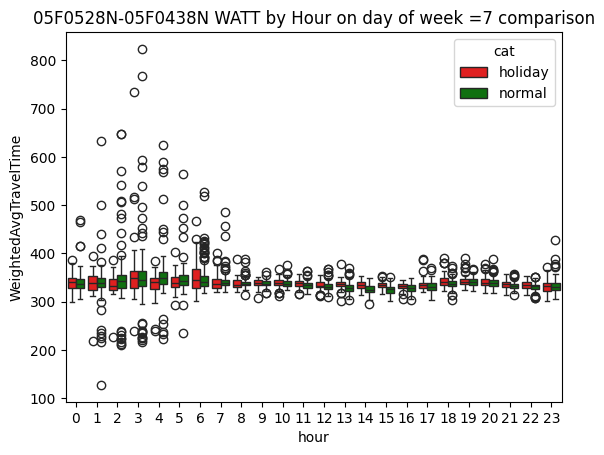

In [78]:
holiday_vs_normal_watt()

也可以用sns的模板，只是視覺上會壅擠一些  

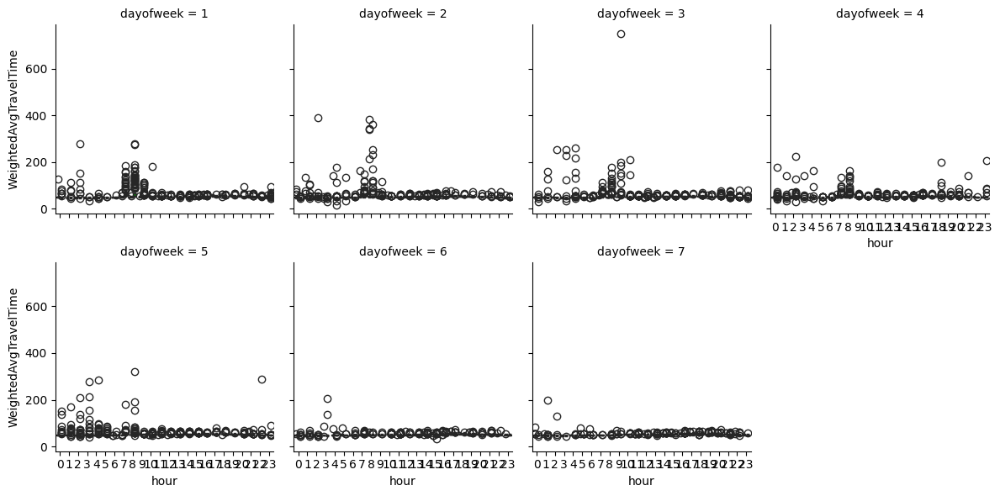

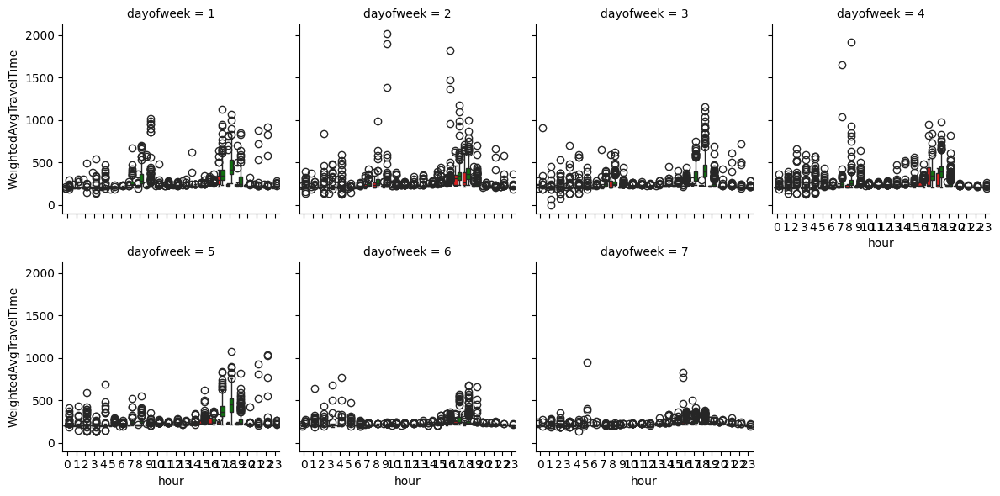

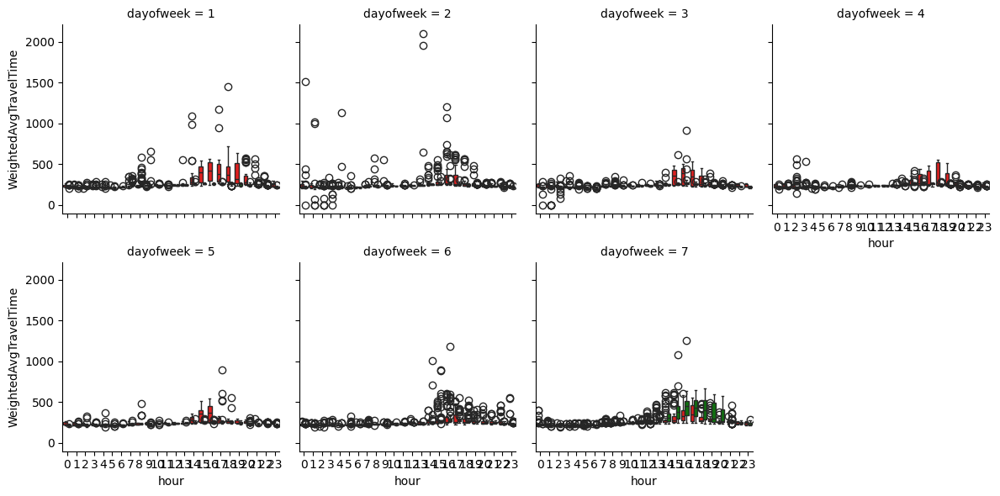

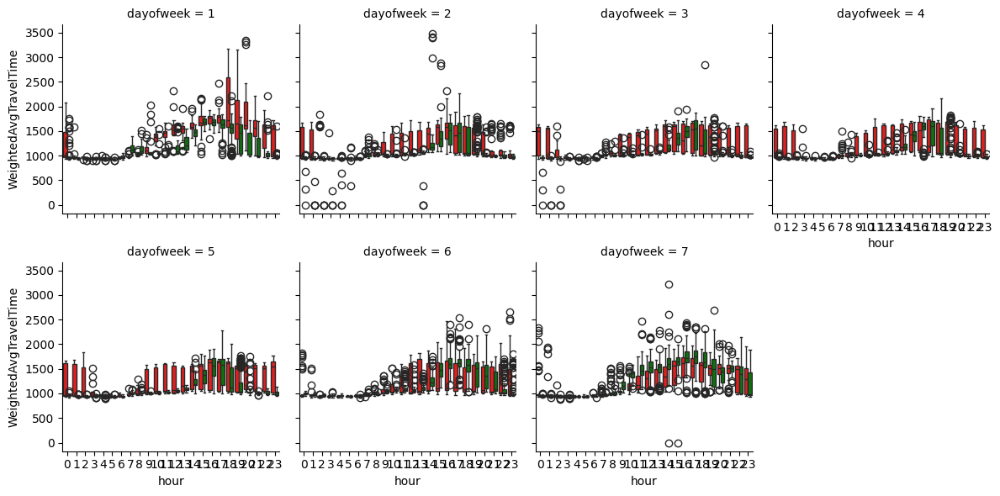

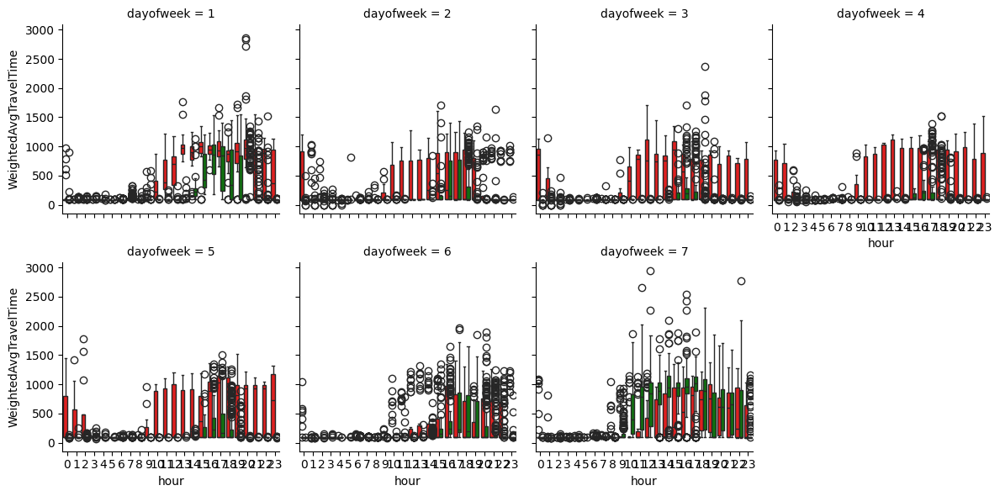

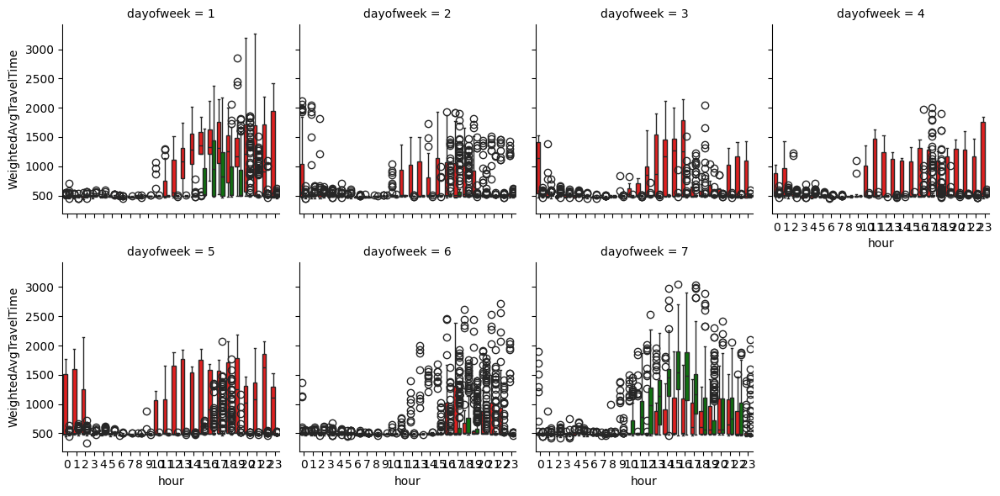

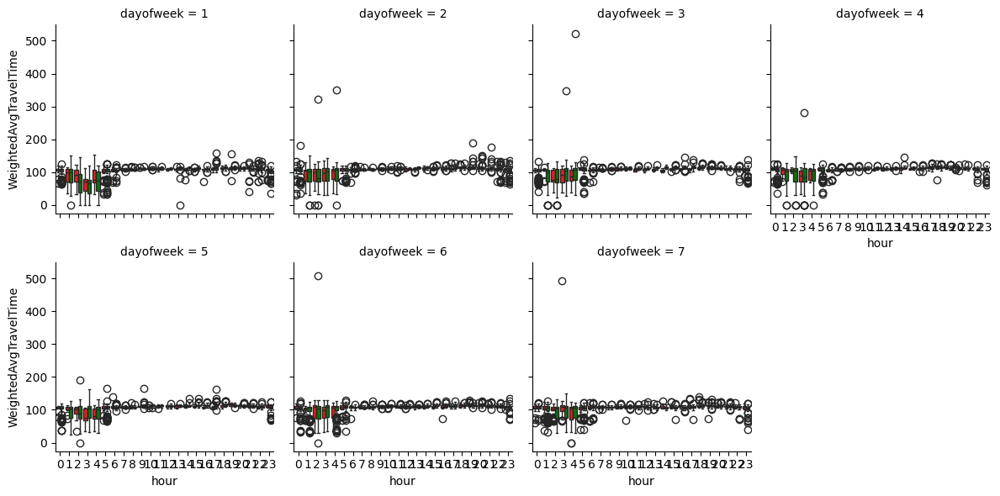

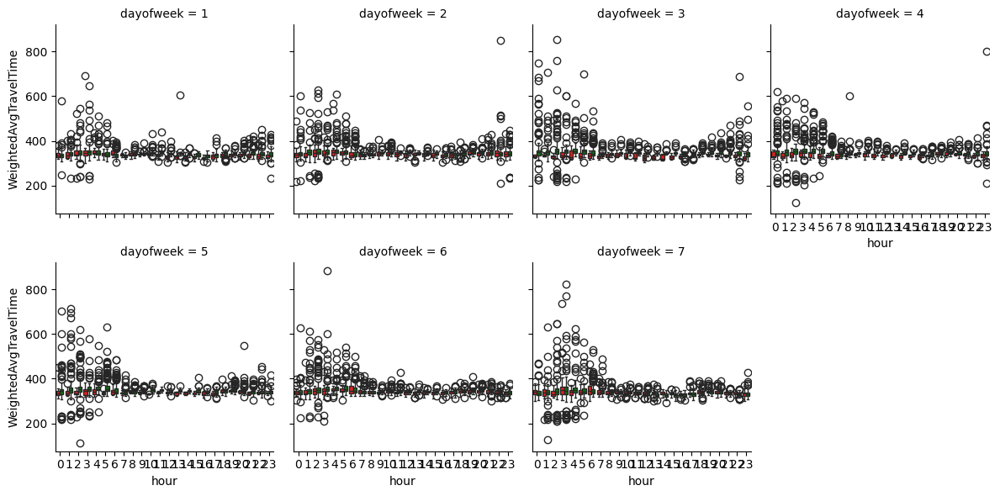

In [28]:
for gf_gt in nu_df.gf_gt.unique():
    temp_df = nu_df[(nu_df.gf_gt==gf_gt)].copy()

    g = sns.FacetGrid(temp_df, col="dayofweek", height=3, col_wrap=4)
    g.map_dataframe(sns.boxplot, x="hour", y="WeightedAvgTravelTime",
                    hue="cat", palette=["r", "g"])

我們可以看到，撇除離群值，普遍的節假日對於旅行時間會有兩種影響:
1. 直接增加旅行時間  
2. 讓該日的旅行時間分布改變，產生位移

In [29]:
holiday_only_df.holiday_name.unique()

array(['跨年元旦', '農曆新年', '元宵節', '西洋情人節', '二二八紀念日', '白色情人節', '兒童與清明節', '勞動節',
       '母親節', '端午節', '父親節', '七夕情人節', '中元節', '教師節', '中秋節', '國慶日', '萬聖節',
       '聖誕節'], dtype=object)

### 單一假日檢視

以下的code可以再自行改變holiday的參考下去視覺化假日與平日的差異   
比較的方法是目標節日當天的每小時旅行時間分布對比同月的正常旅行時間分布  
有兩種視覺化方法  
第一種單獨檢視門架間一星期每天的分布比較  
第二種是用seaborn的facetgrid來並排比較，但會受限於share yaxis的狀況，有的資訊可能不好判讀  
各有利弊  

In [30]:
def holiday_vs_normal_watt(holiday_name: str) -> None:
    # 拉出節假日的月份、對比的星期幾
    q_string = f"holiday_name=='{holiday_name}'"
    ta_holiday_df = holiday_only_df.query(q_string).copy()
    target_month_list = ta_holiday_df['month'].unique().tolist()
    target_dayofweek_list =ta_holiday_df['dayofweek'].unique().tolist()
    # 目標範圍作為正常旅行時間範圍的限縮條件用途
    condi1 = normal_traffic_df.month.isin(target_month_list)
    condi2 = normal_traffic_df.dayofweek.isin(target_dayofweek_list)
    ta_normal_traffic_df = normal_traffic_df[condi1 & condi2].copy()
    
    nu_df = pd.concat([ta_holiday_df[['gf_gt', 'hour', 'dayofweek', 'WeightedAvgTravelTime', 'cat']],
                       ta_normal_traffic_df[['gf_gt', 'hour', 'dayofweek', 'WeightedAvgTravelTime', 'cat']]]) 

    for gf_gt in nu_df.gf_gt.unique():
        for dayofweek in nu_df.dayofweek.unique():
            temp_df = nu_df[(nu_df.gf_gt==gf_gt) & (nu_df.dayofweek==dayofweek)].copy()
            sns.boxplot(x="hour", y="WeightedAvgTravelTime",
                        hue="cat", palette=["r", "g"],
                        data=temp_df,
                        fliersize=0
                        )
            plt.title(f'{gf_gt} WATT by Hour on Day of Week ={dayofweek} comparison')
            plt.show()

In [31]:
def holiday_vs_normal_watt_facetgrid(holiday_name: str) -> None:
    # 拉出節假日的月份、對比的星期幾
    q_string = f"holiday_name=='{holiday_name}'"
    ta_holiday_df = holiday_only_df.query(q_string).copy()
    target_month_list = ta_holiday_df['month'].unique().tolist()
    target_dayofweek_list =ta_holiday_df['dayofweek'].unique().tolist()
    # 目標範圍作為正常旅行時間範圍的限縮條件用途
    condi1 = normal_traffic_df.month.isin(target_month_list)
    condi2 = normal_traffic_df.dayofweek.isin(target_dayofweek_list)
    ta_normal_traffic_df = normal_traffic_df[condi1 & condi2].copy()
    
    nu_df = pd.concat([ta_holiday_df[['gf_gt', 'hour', 'dayofweek', 'WeightedAvgTravelTime', 'cat']],
                       ta_normal_traffic_df[['gf_gt', 'hour', 'dayofweek', 'WeightedAvgTravelTime', 'cat']]]) 

    for gf_gt in nu_df.gf_gt.unique():
        temp_df = nu_df[(nu_df.gf_gt==gf_gt)].copy()
        g = sns.FacetGrid(temp_df, col="dayofweek", height=3, col_wrap=4)
        g.map_dataframe(sns.boxplot, x="hour", y="WeightedAvgTravelTime",
                        hue="cat", palette=["r", "g"])

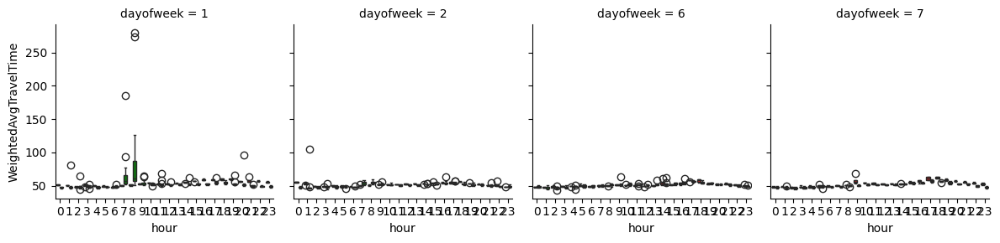

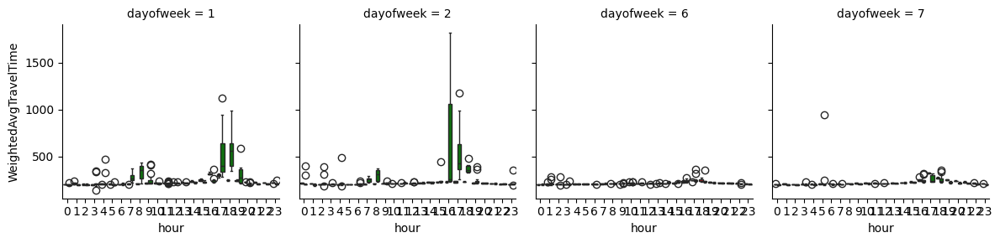

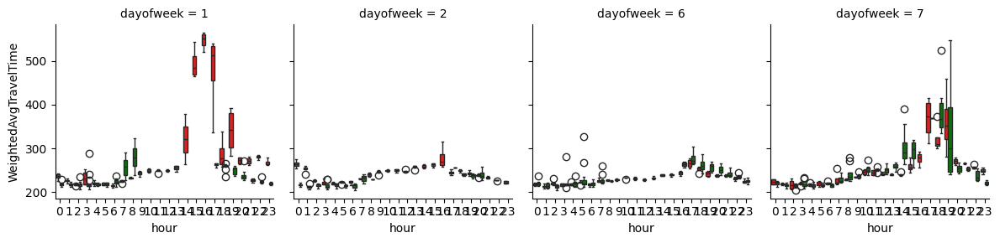

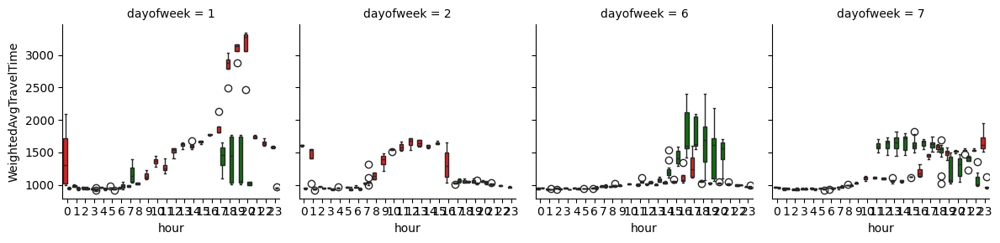

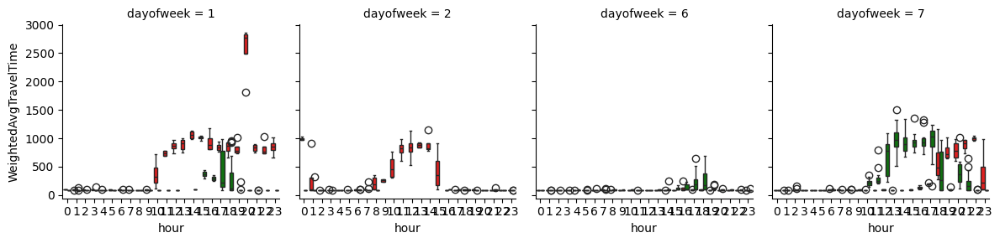

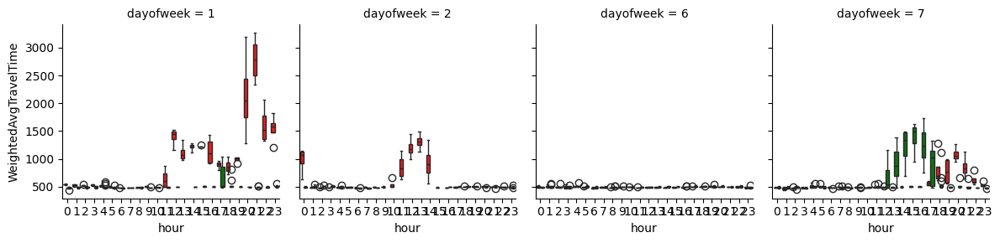

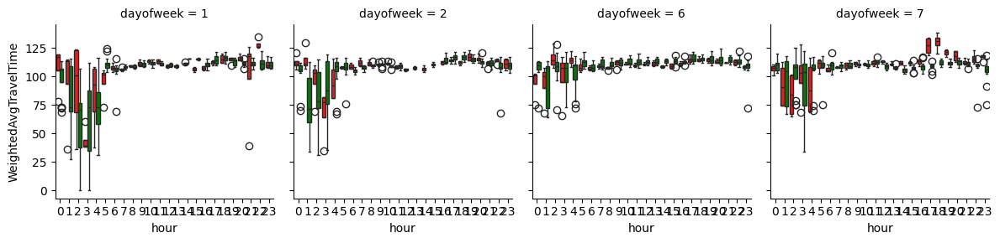

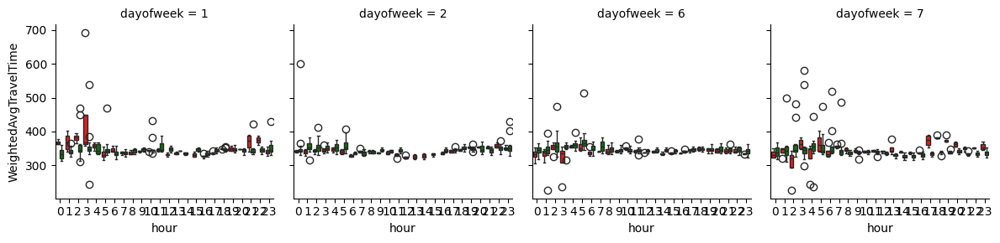

In [32]:
holiday_vs_normal_watt_facetgrid('國慶日')

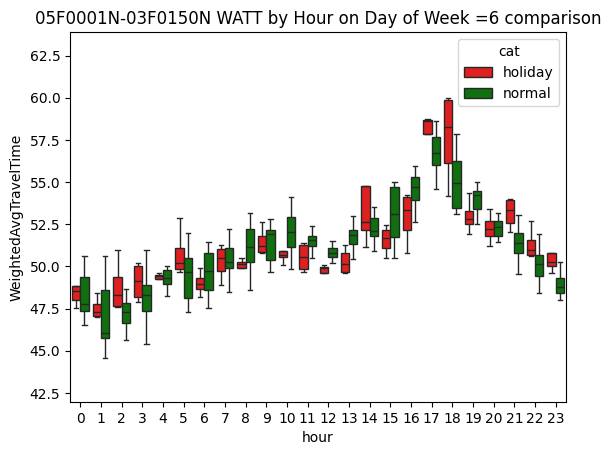

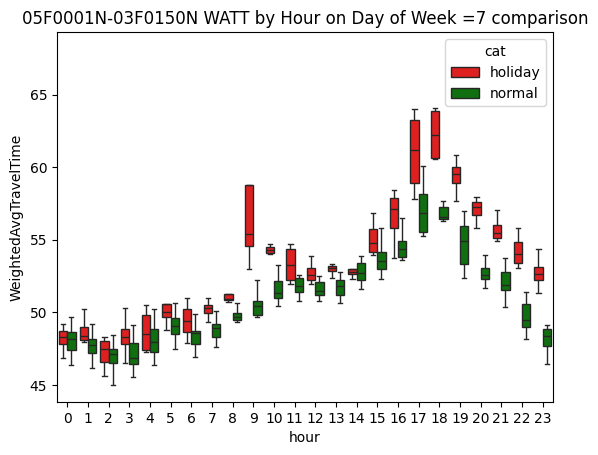

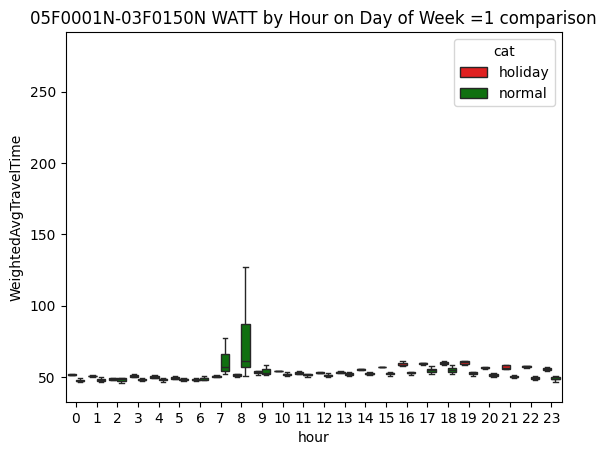

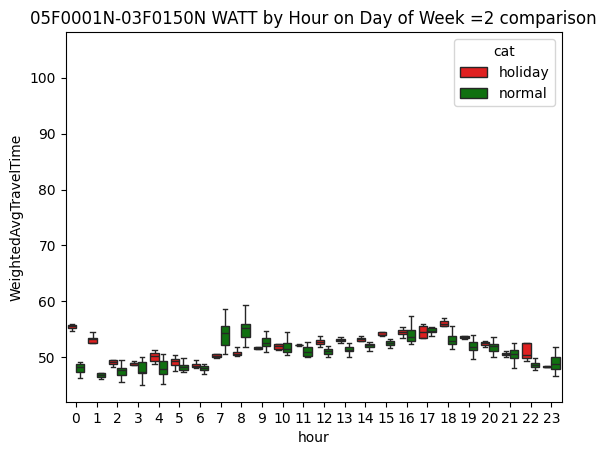

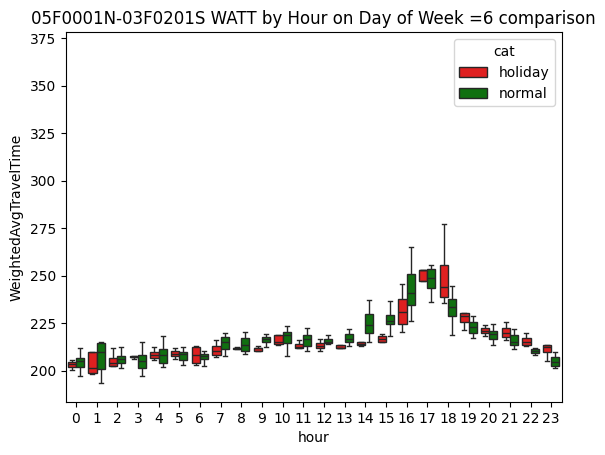

...

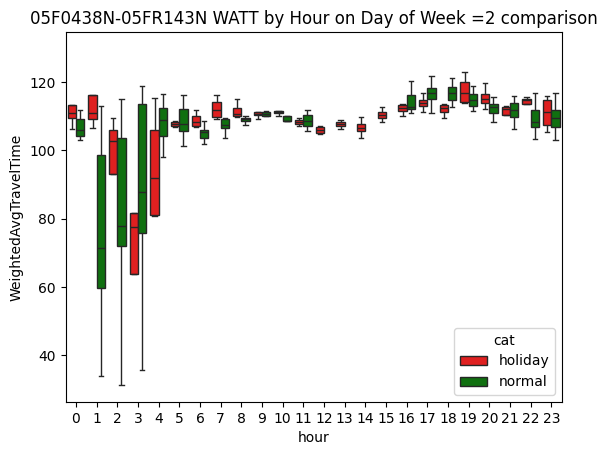

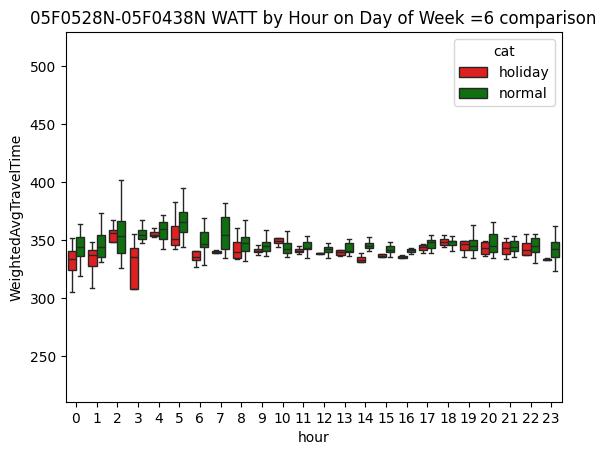

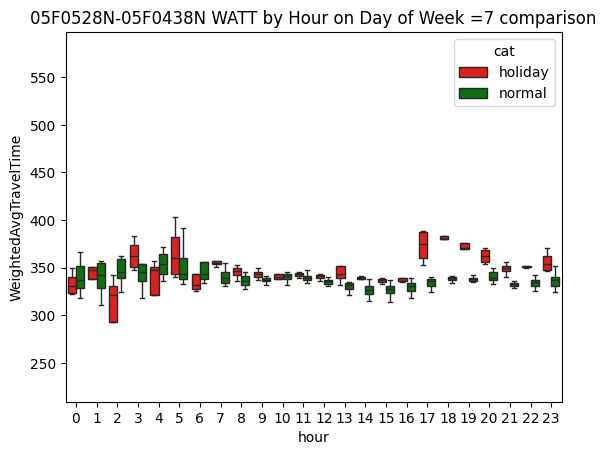

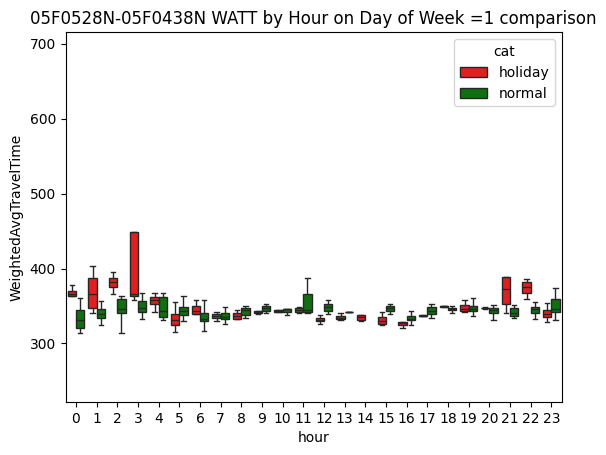

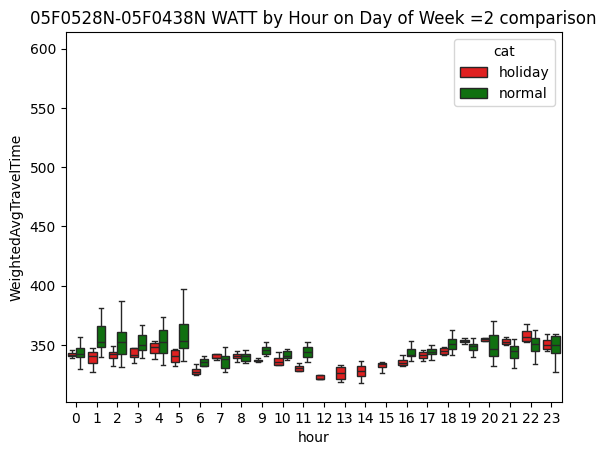

In [33]:
holiday_vs_normal_watt('國慶日')

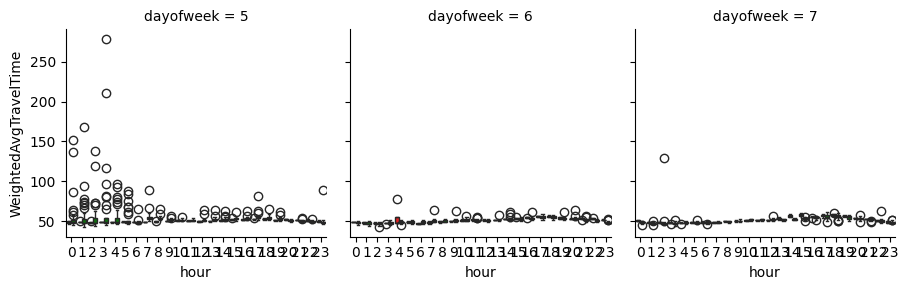

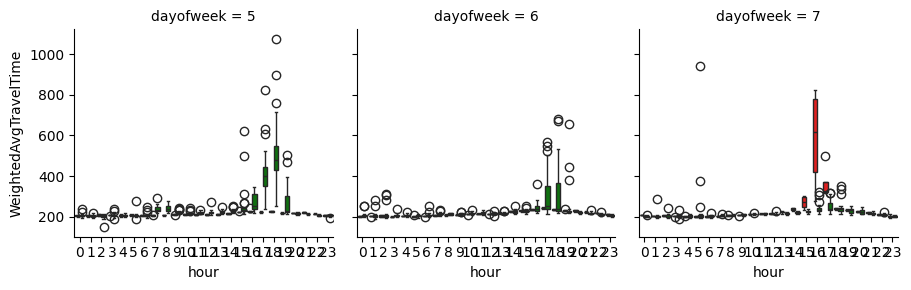

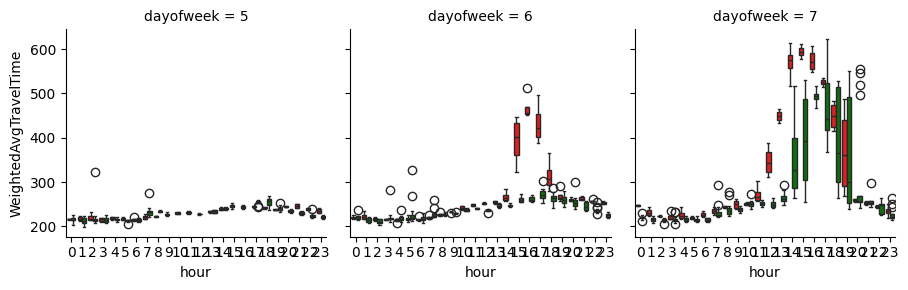

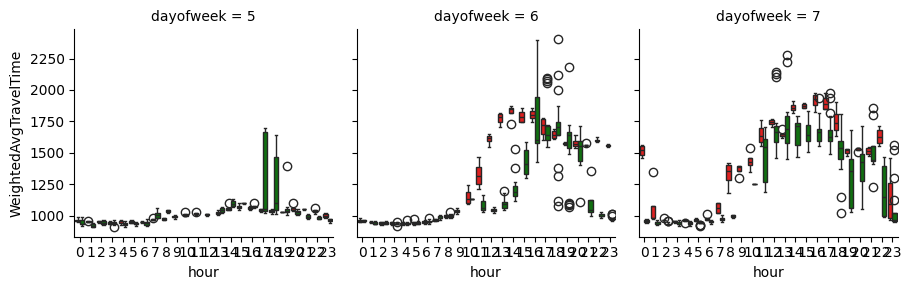

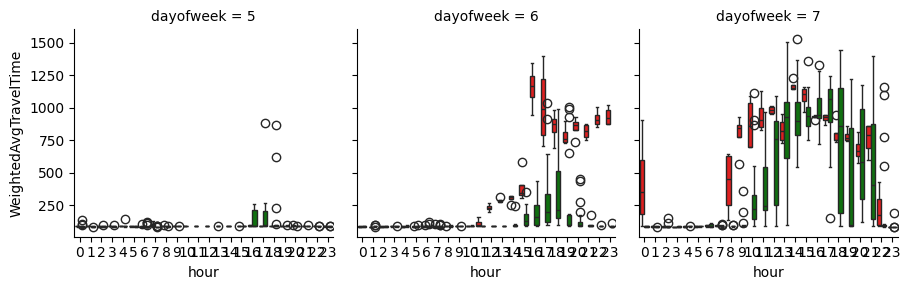

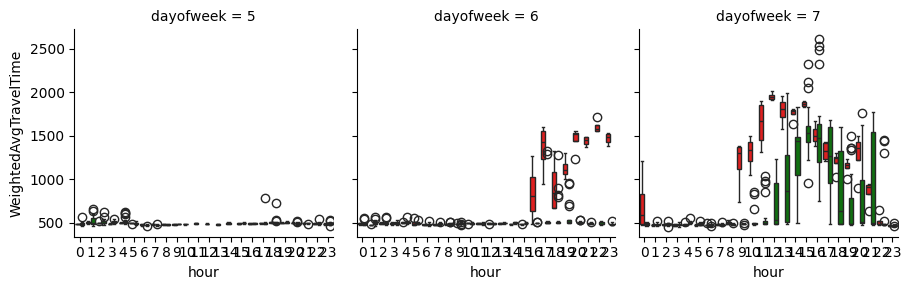

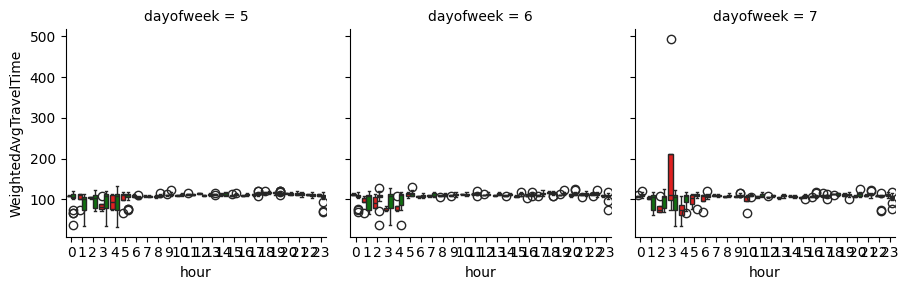

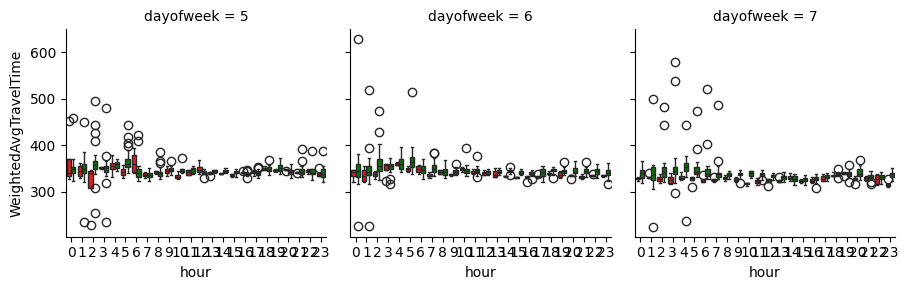

In [34]:
holiday_vs_normal_watt_facetgrid('中秋節')

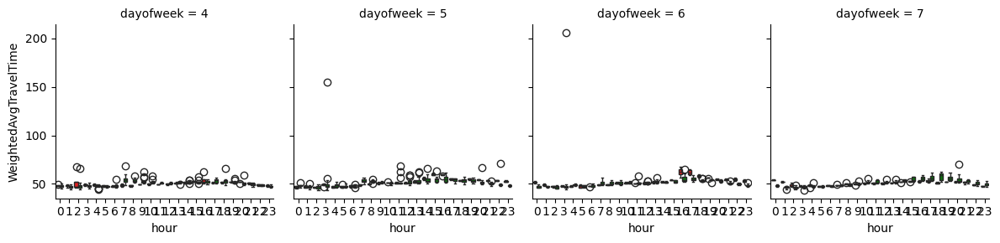

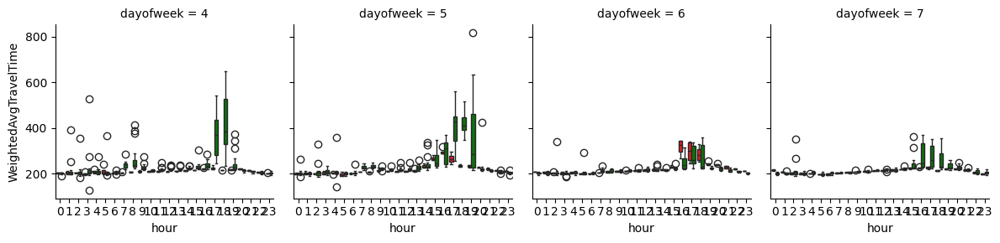

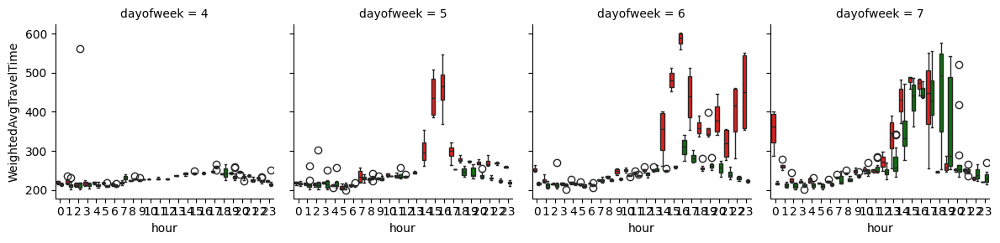

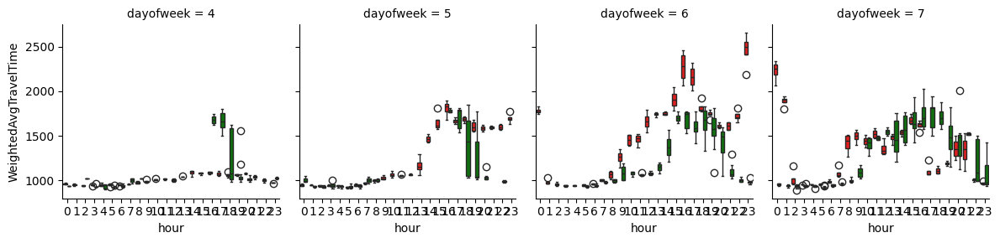

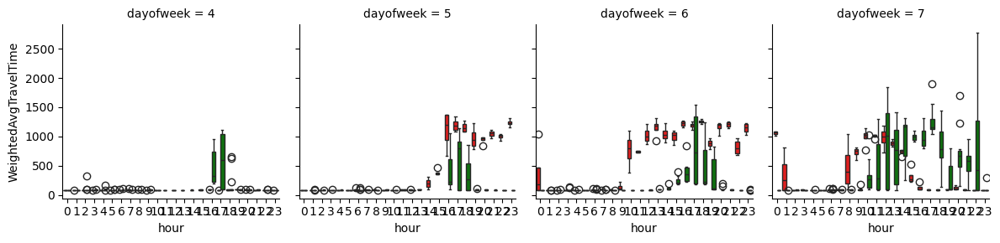

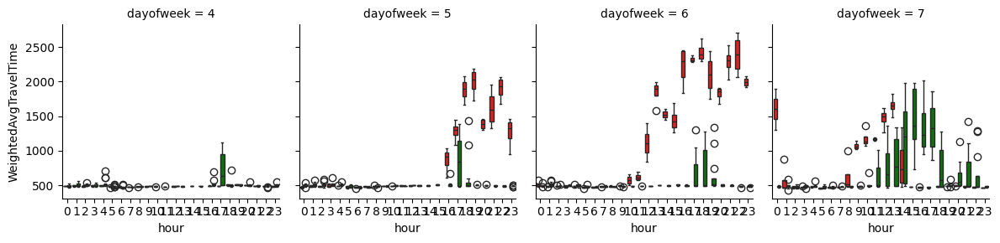

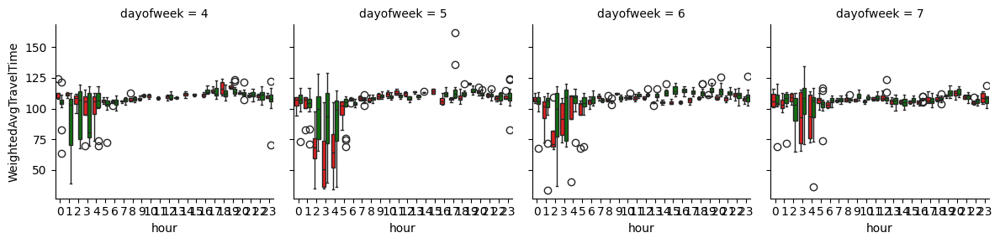

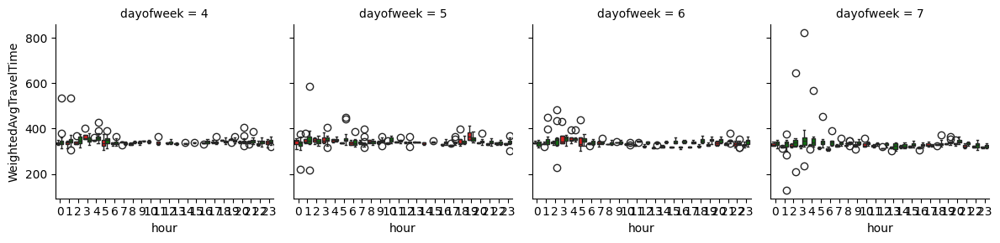

In [35]:
holiday_vs_normal_watt_facetgrid('端午節')

看完中秋節、國慶日，我們可以判斷應該有一些東西是在事故、節日、道路修整之外沒有被放進去考量的  
有可能尖峰時刻影響就很大?  
這類型的資訊並沒有特別將特徵獨立出來  
但正常的尖離峰時刻所有的影響會反映在時間趨勢的長期表現上  
進行預測時，如果使用較強的模型，應該本身就有辦法去捕捉這個趨勢  

## 事故點對旅行時間影響

事故類型資料受限於其特性，是相對稀少的  
有的路段可能在我們觀測的範圍內沒有發生過事故，或是次數稀少  
再來是事故的嚴重程度跟範圍也會影響到旅行時間  
綜合以上因素，光推論就知道要完整納入影響有其困難性  
這邊的分析就沒有特別排除假日等其他因子，只要符合發生事故就算在內  

In [57]:
# 確認一下事故發生的區段，可以發現僅有五個在時間段中存在
condi_1 = hw5_15watt_holi_rb_tra.accident_type != 0
tra_only_df = hw5_15watt_holi_rb_tra[condi_1].copy()
tra_only_df.gf_gt.value_counts()

gf_gt
05F0287N-05F0055N    88
05F0055N-05F0001N    52
05F0438N-05F0309N    31
05F0309N-05F0287N    22
05F0528N-05F0438N     2
Name: count, dtype: int64

In [70]:
def accident_vs_normal_watt() -> None:
    # 拉出事故的部分
    condi_1 = hw5_15watt_holi_rb_tra.accident_type != 0
    tra_only_df = hw5_15watt_holi_rb_tra[condi_1].copy()
    
    tra_only_df['cat'] = 'traffic_accident'
    normal_traffic_df['cat'] = 'normal'

    # 組合事故與正常日的資料
    nu_df = pd.concat([tra_only_df[['gf_gt', 'hour', 'dayofweek', 'WeightedAvgTravelTime', 'cat']],
                       normal_traffic_df[['gf_gt', 'hour', 'dayofweek', 'WeightedAvgTravelTime', 'cat']]])    

    for gf_gt in nu_df.gf_gt.unique():
        temp_df = nu_df[(nu_df.gf_gt==gf_gt)].copy()
        if 'traffic_accident' not in temp_df.cat.unique():
            print(f'{gf_gt} had no traffic accident')
            continue
        # 臨時忽略警告
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
        
            # 繪圖
            g = sns.FacetGrid(temp_df, col="dayofweek", height=3, col_wrap=4)
            g.map_dataframe(sns.boxplot, x="hour", y="WeightedAvgTravelTime",
                            hue="cat", palette=["r", "g"])
    return None

05F0001N-03F0150N had no traffic accident
05F0001N-03F0201S had no traffic accident
05F0438N-05FR143N had no traffic accident
CPU times: total: 8.59 s
Wall time: 8.68 s


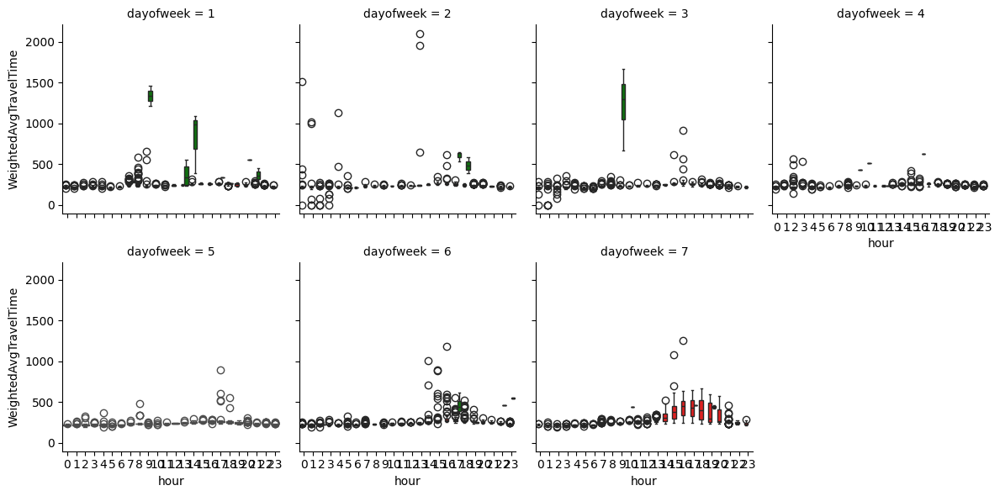

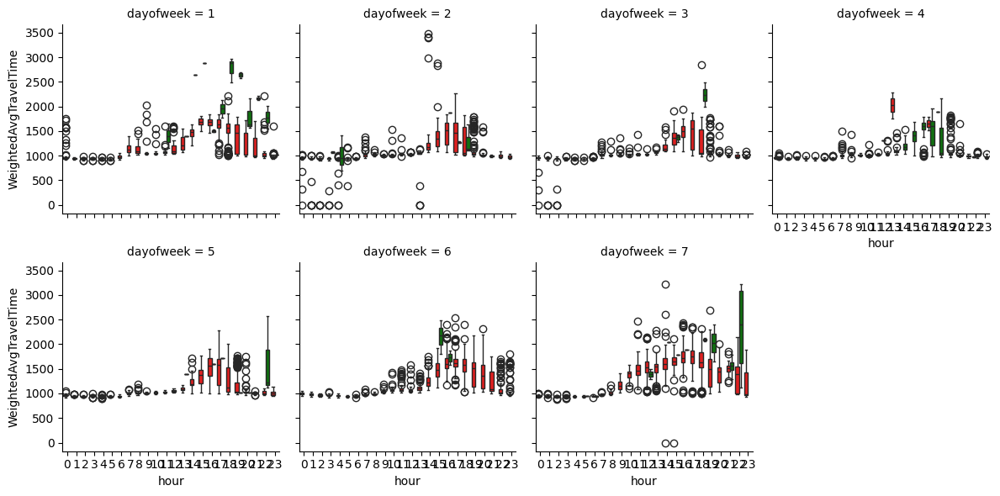

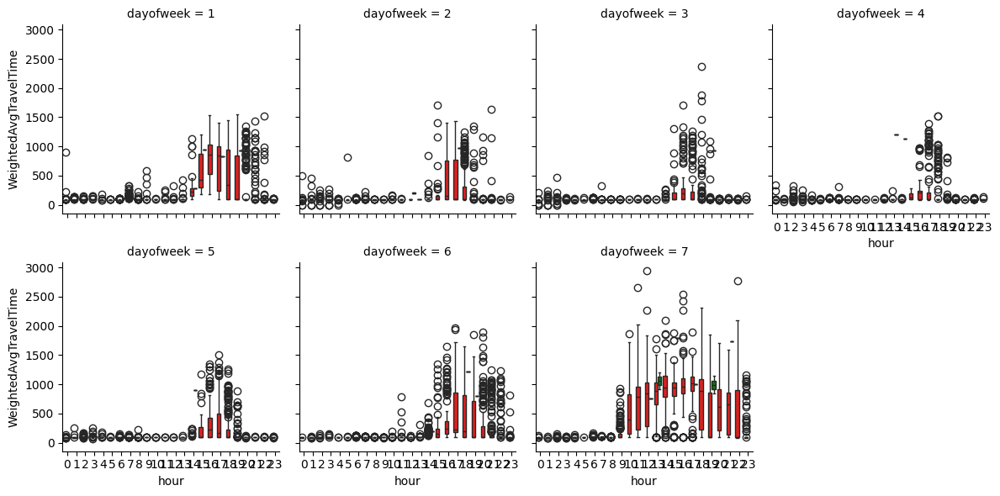

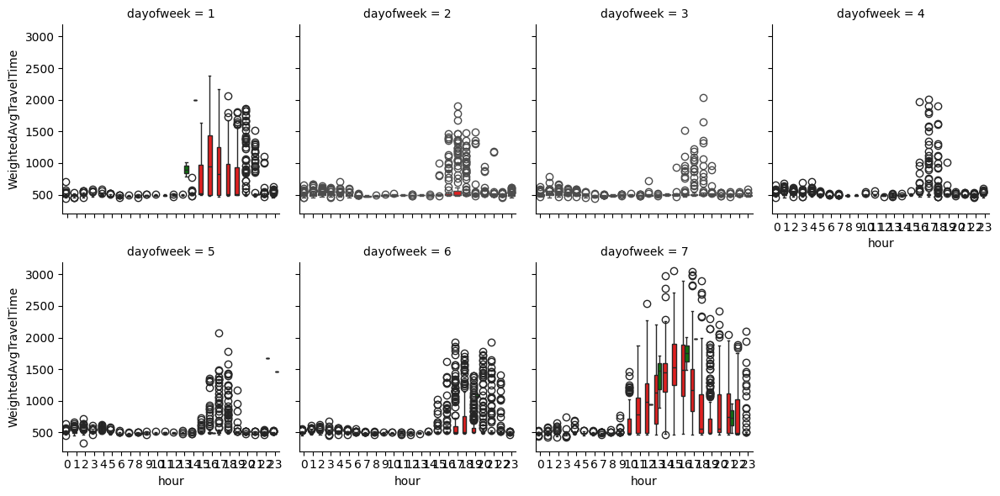

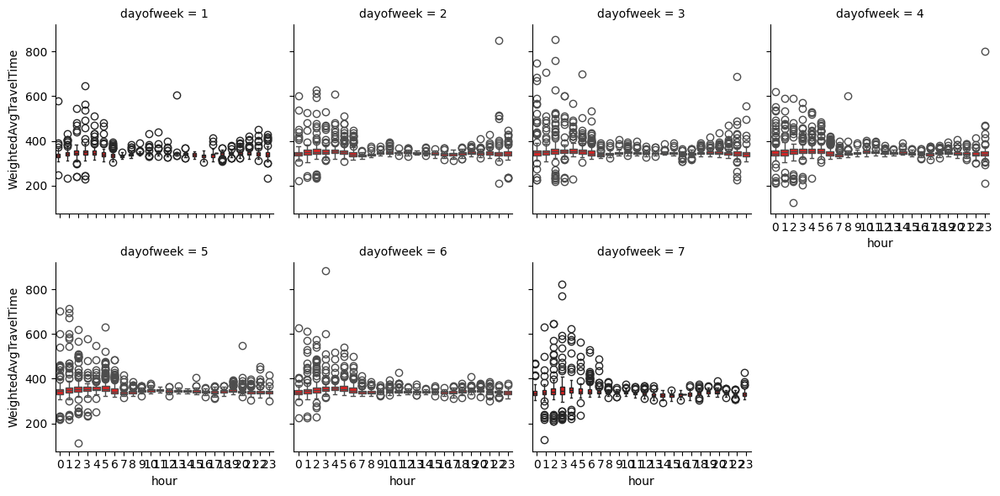

In [71]:
%%time
accident_vs_normal_watt()

透過上面幾組我們可以假設，事故應該有一定的影響  
只是這邊沒有特別再把其他可能影響因子一起排除  

## 道路修整對旅行時間影響

In [73]:
# 確認一下道路施工發生的區段，可以發現僅有六個在時間段中存在
condi_1 = hw5_15watt_holi_rb_tra.road_build != 0
roadbuild_only_df = hw5_15watt_holi_rb_tra[condi_1].copy()
roadbuild_only_df.gf_gt.value_counts()

gf_gt
05F0287N-05F0055N    18001
05F0055N-05F0001N    16097
05F0309N-05F0287N     8358
05F0438N-05F0309N     7553
05F0528N-05F0438N     6601
05F0438N-05FR143N     6472
Name: count, dtype: int64

In [74]:
def roadbuild_vs_normal_watt() -> None:
    # 拉出道路施工的部分
    condi_1 = hw5_15watt_holi_rb_tra.road_build != 0
    roadbuild_only_df = hw5_15watt_holi_rb_tra[condi_1].copy()
    
    roadbuild_only_df['cat'] = 'road_build'
    normal_traffic_df['cat'] = 'normal'

    # 組合施工與正常日的資料
    nu_df = pd.concat([roadbuild_only_df[['gf_gt', 'hour', 'dayofweek', 'WeightedAvgTravelTime', 'cat']],
                       normal_traffic_df[['gf_gt', 'hour', 'dayofweek', 'WeightedAvgTravelTime', 'cat']]])    

    for gf_gt in nu_df.gf_gt.unique():
        temp_df = nu_df[(nu_df.gf_gt==gf_gt)].copy()
        if 'road_build' not in temp_df.cat.unique():
            print(f'{gf_gt} had no road_build event')
            continue
        # 臨時忽略警告
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
        
            # 繪圖
            g = sns.FacetGrid(temp_df, col="dayofweek", height=3, col_wrap=4)
            g.map_dataframe(sns.boxplot, x="hour", y="WeightedAvgTravelTime",
                            hue="cat", palette=["r", "g"])
    return None

05F0001N-03F0150N had no road_build event
05F0001N-03F0201S had no road_build event


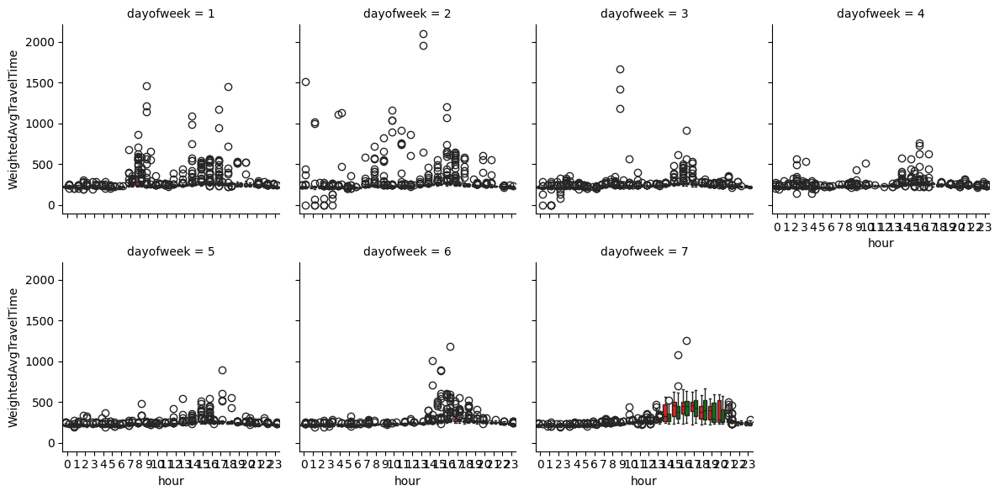

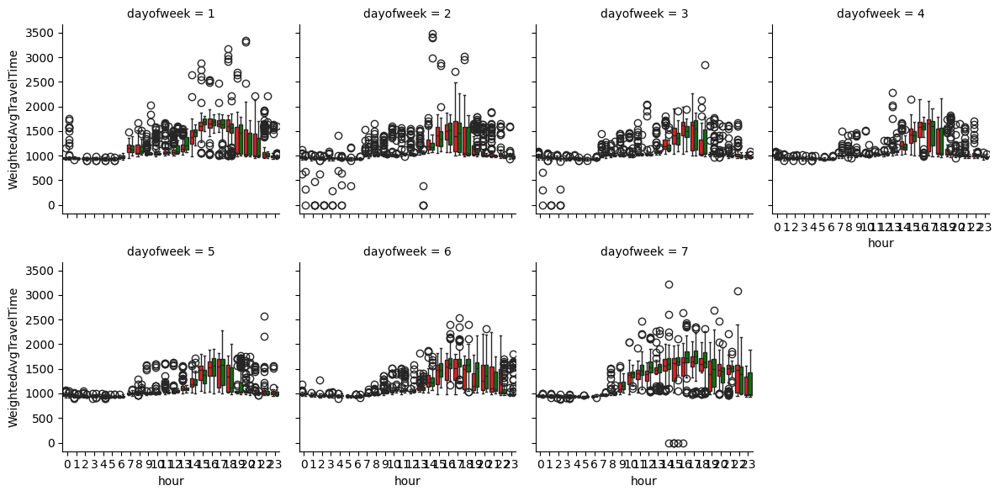

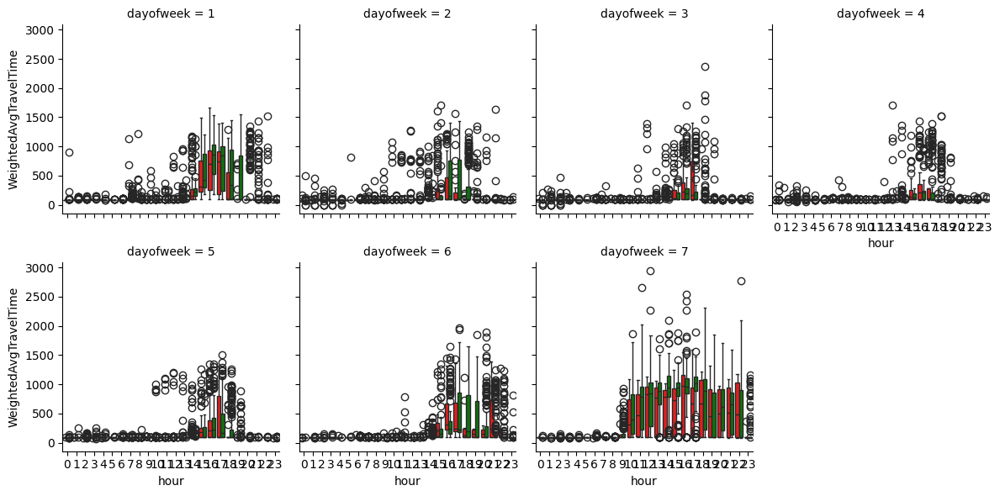

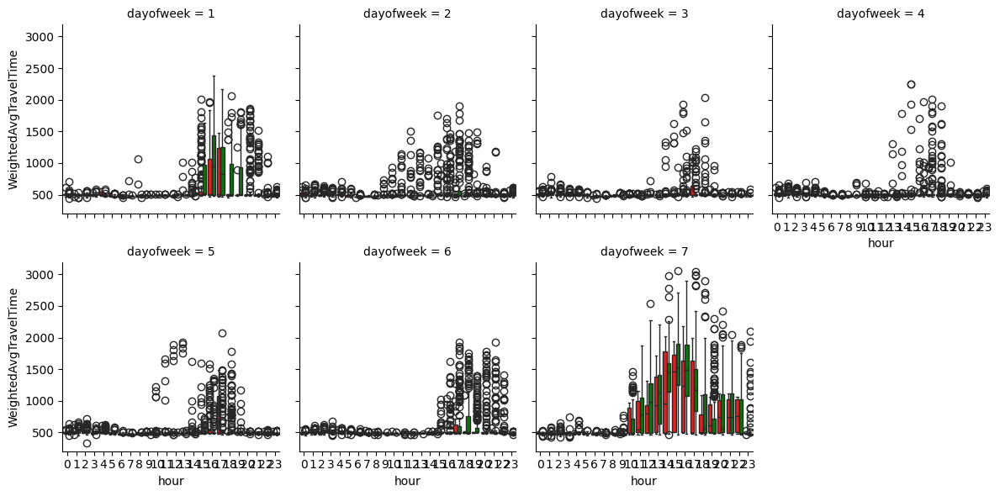

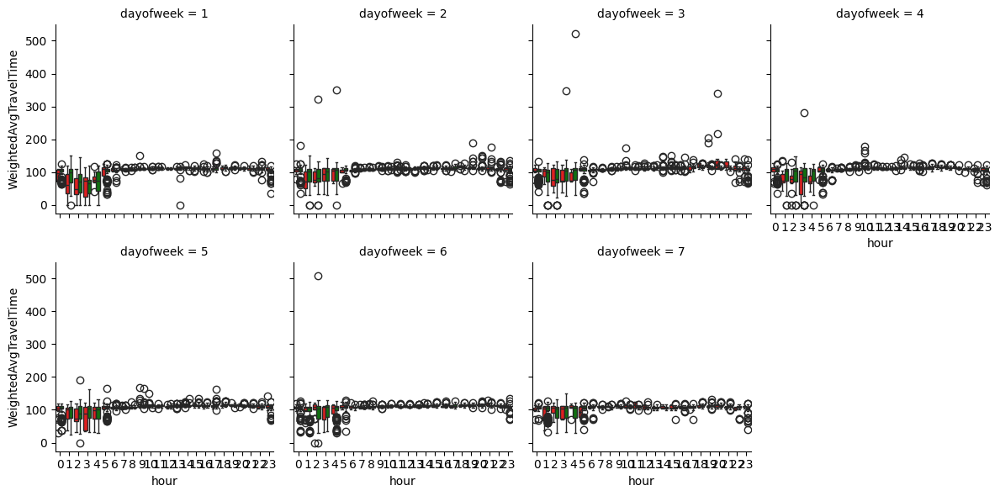

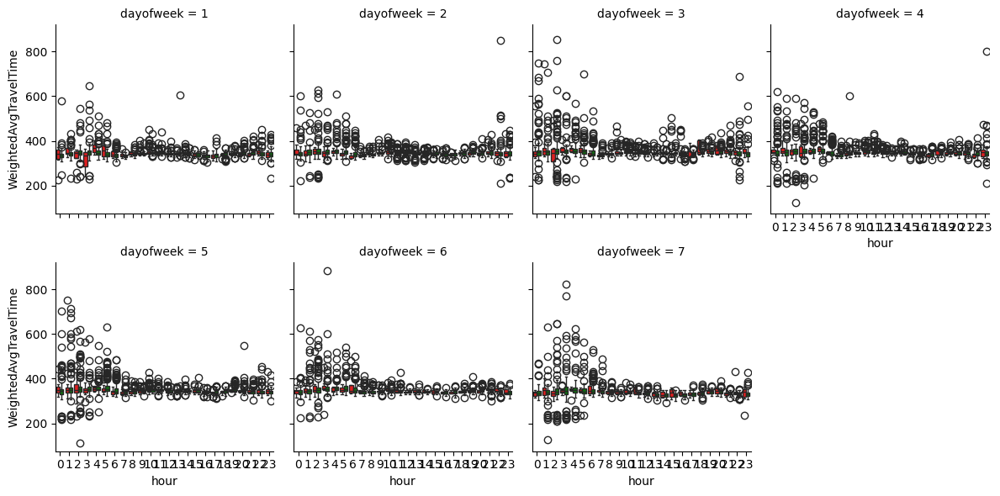

In [75]:
roadbuild_vs_normal_watt()

從上面的分布看來，道路修整的影響似乎沒有那麼確切  
無論有或沒有部份路段的表現是差不多的  